<a href="https://colab.research.google.com/github/danielsoy/ALOCC-CVPR2018/blob/master/casicien_555x55_segmetacion_central_six_botellas_mvtec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UNSUPERVISED ANOMALY SEGMENTATION
### This is a implementation of **DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation** https://arxiv.org/abs/2012.07122
#### We train only with OK images, and then we predict a hotmap, where high areas are presumably anomalous
#### The pretrained weights provided by me (input anomalysegmentation-weights) are not very good because Kaggle limits training time to 9hrs

CAMBIAR DOS PATH HACIA EL DATASET, RAIZ(SCREW X EJEMPLO), Y TEST. EN DRIVE, AGRUPAR TODOS LOS DEFECTOS, EN LA CARPETA MAL.
Y CAMBIAR EL NOMBRE DE GOOD A BIEN.
cOLOCAR  1 EPOCH PARA PROBAR SI LLEGA LA NOTEBOOK AL FINAL. 

In [16]:
# https://www.kaggle.com/danieldelro/unsupervised-anomaly-segmentation-of-screw-images/data?scriptVersionId=80138081

## IMPORTS

In [4]:
!pip install tqdm

In [5]:
import tensorflow as tf  
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from skimage import io
from skimage.transform import resize

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import cv2

import random
import os
from tqdm import tqdm

from random import randrange

In [2]:
from google.colab import drive

In [6]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Custom Data Generator

In [17]:
class CustomDataGen(tf.keras.utils.Sequence):    #/content/drive/MyDrive/screw/test
    
    def __init__(self, path = "/content/drive/MyDrive/casicien",# aca dir raiz del dataset, este caso:screw
                  batch_size = 1,
                 input_size=(550,550),
                 shuffle=True, seed = None, subset = 'training'):
        
        self.image_data_generator = ImageDataGenerator(rescale=1. / 255, data_format='channels_last',     
            #zoom_range = 0.1,
            #width_shift_range = 0.05,
            #height_shift_range = 0.05,
            brightness_range=(0.5,1.5)
            
        )
        
        if seed is None:
            random.randint(0, 2**32)
            
        self.batch_size = batch_size
        self.input_size = input_size
        
        self.X_paths = [os.fsdecode(file) for file in os.scandir(f"{path}/train/good")]
        self.X_train, self.X_val = train_test_split(self.X_paths, test_size=0.2, random_state = seed, shuffle = True)
        
        if subset == 'training':            
            self.X = self.X_train
        elif subset == 'validation':
            self.X = self.X_val
            
        self.n = len(self.X)
    
    
    def __getitem__(self, index):
        
        data_x = []
        
        for i in range(self.batch_size):
            image = cv2.imread(self.X[self.batch_size * index + i])
            
            image = self.image_data_generator.random_transform(image)
            
            image = image / 255
            
            image = tf.image.resize(image, self.input_size)
            data_x.append(image)
            
        data_x = np.array(data_x)
        
        return data_x, data_x
    
    def __len__(self):            
        return self.n // self.batch_size

In [18]:
INPUT_SIZE = (224,224)
seed = random.randint(0, 2**32)
train_datagen = CustomDataGen(input_size = INPUT_SIZE, batch_size = 1, seed = seed)
validation_datagen = CustomDataGen(input_size = INPUT_SIZE, subset = "validation", seed = seed) 
#/content/drive/MyDrive/SCREW/train/good

In [19]:
#Check we dont have the same images in train and validation sets
any([value in train_datagen.X for value in validation_datagen.X])

False

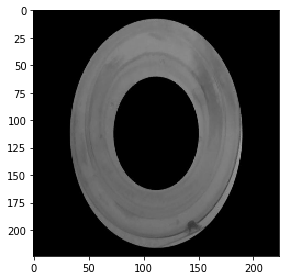

In [20]:
x, y = train_datagen[0]
io.imshow(x[0])
io.show()

## Model

In [21]:
input_model_filepath = "../content/anomaly-segmentation-model_vgg19.h5"
output_model_filepath = "./anomaly-segmentation-model.h5"
#model class
#Implementation of DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation https://arxiv.org/abs/2012.07122
class AnomalySegmentator(tf.keras.Model):
    def __init__(self, init_layer = 0, end_layer = None):
        super(AnomalySegmentator, self).__init__()
        #self.L2_weight = 1e-6
        self.init_layer = init_layer
        self.end_layer = end_layer
        
    def build_autoencoder(self, c0, cd):
        self.autoencoder = Sequential([
            layers.InputLayer((self.map_shape[0]//4, self.map_shape[1]//4, c0)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(cd,(1,1), padding='same'),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(c0,(1,1), padding='same')            
            
        ])
        
    def build(self, input_shape):
        
   ##   self.vgg = VGG19(include_top = False, weights = None, input_shape=input_shape[1:])    # original 
        self.vgg = VGG19(include_top = False, weights = 'imagenet', input_shape=input_shape[1:])  # weights=None, sin pesos


        self.features_list = [layer.output for layer in self.vgg.layers if 'conv' in layer.name][self.init_layer:self.end_layer]
        
        self.feature_extractor = Model(inputs = self.vgg.input, 
                                       outputs = self.features_list)
        self.feature_extractor.trainable = False   
        
        self.threshold = tf.Variable(0, trainable = False, dtype = tf.float32)

        self.map_shape = self.features_list[0].shape[1:-1]
        
        self.average_pooling = layers.AveragePooling2D(pool_size=(4, 4), strides=(4,4))       
        
        
        
        self.c0 = sum([feature.shape[-1] for feature in self.features_list])        
        self.cd = 40        
        self.build_autoencoder(self.c0, self.cd)
        
          
    def call(self, inputs):
        features = self.feature_extractor(inputs)
        resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
        resized_features = tf.concat(resized_features, axis = -1)
        
        resized_features = self.average_pooling(resized_features)

        autoencoder_output = self.autoencoder(resized_features)
        return tf.reduce_sum((autoencoder_output - resized_features)**2, axis = -1)
        
    def reconstruction_loss(self):
        @tf.function
        def _loss(y_true, y_pred):
            loss = tf.reduce_mean(y_pred, axis = (1,2)) / (tf.cast(tf.shape(y_pred)[0], tf.float32) * self.c0)
            return loss
                    
        return _loss

    def compute_threshold(self, data_loader, fpr = 0.05):
      error = []
      for i in tqdm(range(len(data_loader))):
        x, y = data_loader[i]
        error.append(self(x))

      threshold = np.percentile(error, 100 - fpr)
      self.threshold = tf.Variable(threshold, trainable = False, dtype = tf.float32)
        
    def compute_pca(self, data_loader):
        extraction_per_sample = 20
        
        extractions = []        
        for i in tqdm(range(len(data_loader))):
            x, _ = data_loader[i]     
            
            features = self.feature_extractor(x)
            resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
            resized_features = tf.concat(resized_features, axis = -1)

            resized_features = self.average_pooling(resized_features)
            
            for feature in resized_features:
                
                for _ in range(extraction_per_sample):                    
                
                    row, col = randrange(feature.shape[0]), randrange(feature.shape[1])
                    extraction = feature[row, col]
                    extractions.append(extraction)
            
        extractions = np.array(extractions)
        print(f"Extractions Shape: {extractions.shape}")
        pca = PCA(0.9, svd_solver = "full")
        pca.fit(extractions)
        self.cd = pca.n_components_
        self.build_autoencoder(self.c0, self.cd)
        print(f"Components with explainable variance 0.9 -> {self.cd}")
        
as_model = AnomalySegmentator()
as_model.compile(Adam(1e-4), loss = as_model.reconstruction_loss())

In [22]:
as_model.compile(Adam(3e-4), loss = as_model.reconstruction_loss())

In [23]:
as_model.build((None, *INPUT_SIZE,3))
# aca falla si esta mal cambiado el weight = imagenet a None.


In [24]:
as_model.compute_pca(train_datagen) # si el batch es grande, OOM tira error ya aca

100%|██████████| 78/78 [00:06<00:00, 11.42it/s]


Extractions Shape: (1560, 5504)
Components with explainable variance 0.9 -> 40


## Training

puede que no tire error omm en PCA, pero despues si aca x tamño de batch. puede ser impar. 3 xej

In [ ]:
#True if we want to train the model
if True:
    # Training the model
    plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.5, patience=5, verbose = 1
    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                          patience=15)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint(output_model_filepath, monitor='val_loss', save_best_only=True,
                                                mode='min', save_weights_only = True)  # Saves the best version of the model to disk (as measured on the validation data set)
          
    history = as_model.fit(train_datagen,
        epochs=10,     ##%%%%%%%%%%%&&&&&&////////((((((((((((EPOCH EPOCH))))))))))))
        validation_data=validation_datagen,
        shuffle=True,
        callbacks=[es, save_best, plateau])
    #Training history
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    as_model.load_weights(output_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.save_weights(output_model_filepath)
else:
    
    as_model.build((None, *INPUT_SIZE,3))
    as_model.load_weights(input_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.summary()
    as_model.autoencoder.summary()

Epoch 1/10
78/78 [==============================] - 21s 273ms/step - loss: 3.9301 - val_loss: 2.7424 - lr: 3.0000e-04
Epoch 2/10
78/78 [==============================] - 22s 279ms/step - loss: 2.3830 - val_loss: 1.9256 - lr: 3.0000e-04
Epoch 3/10
78/78 [==============================] - 22s 282ms/step - loss: 1.8098 - val_loss: 1.7441 - lr: 3.0000e-04
Epoch 4/10
78/78 [==============================] - 22s 286ms/step - loss: 1.5099 - val_loss: 1.5298 - lr: 3.0000e-04
Epoch 5/10
78/78 [==============================] - 22s 288ms/step - loss: 1.3343 - val_loss: 1.2520 - lr: 3.0000e-04
Epoch 6/10
78/78 [==============================] - 23s 290ms/step - loss: 1.1726 - val_loss: 1.0866 - lr: 3.0000e-04
Epoch 7/10
78/78 [==============================] - 22s 285ms/step - loss: 1.1310 - val_loss: 1.0917 - lr: 3.0000e-04
Epoch 8/10
78/78 [==============================] - 23s 296ms/step - loss: 0.9601 - val_loss: 1.0052 - lr: 3.0000e-04
Epoch 9/10
78/78 [==============================] - 23s 

In [26]:
 classes = ['bien', 'mal', ] #folder bien va primero, no anomaly class. folder mal, contiene anomalias.
test_datagen = ImageDataGenerator(rescale=1. / 255, data_format='channels_last', brightness_range=(0.2,1.4) )
test_generator = test_datagen.flow_from_directory("/content/drive/MyDrive/casicien/test", 
                                                  target_size = INPUT_SIZE,
                                                  batch_size = 1,
                                                  class_mode = 'sparse')

## /content/drive/MyDrive/screw/test 
## https://www.kaggle.com/danieldelro/anomalysegmention/data   provee model entrenado 9hs.anomaly-segmentation-model.h5

Found 196 images belonging to 2 classes.


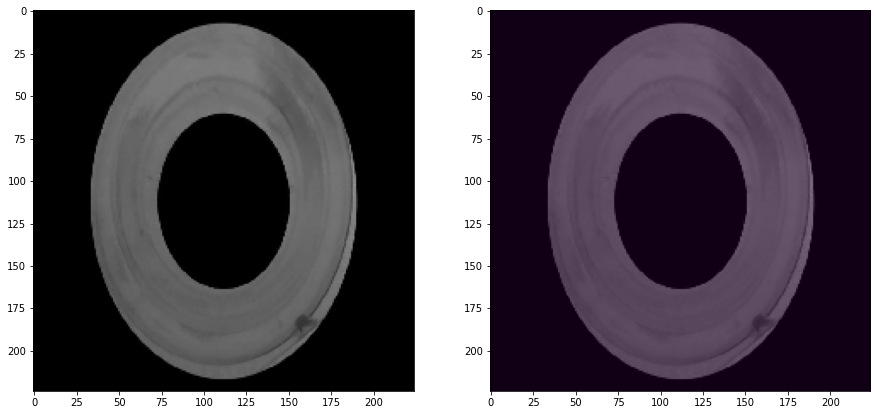

Threshold: 124204.609375 MaxValue: 71898.125
GT: mal, anomaly detected: False


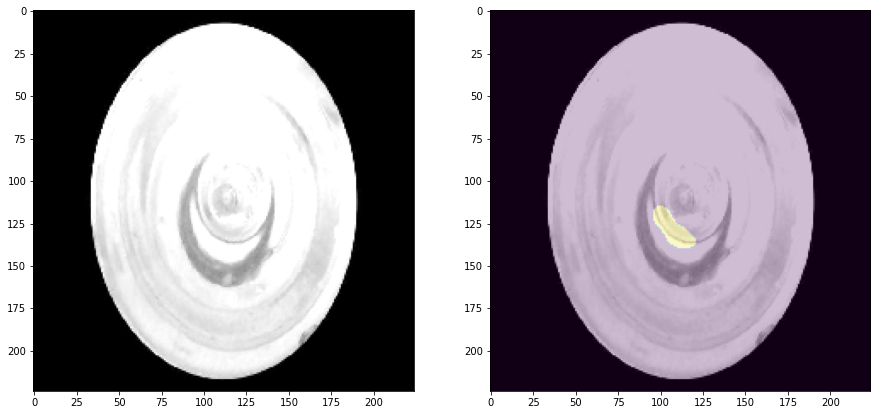

Threshold: 124204.609375 MaxValue: 142397.90625
GT: bien, anomaly detected: True


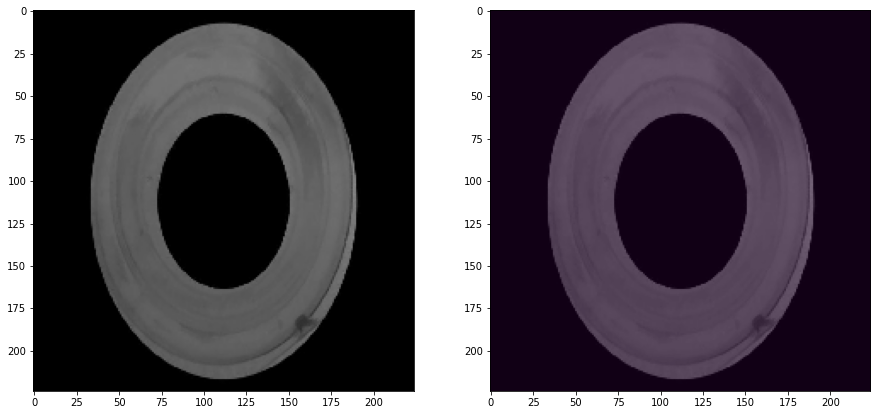

Threshold: 124204.609375 MaxValue: 69257.15625
GT: bien, anomaly detected: False


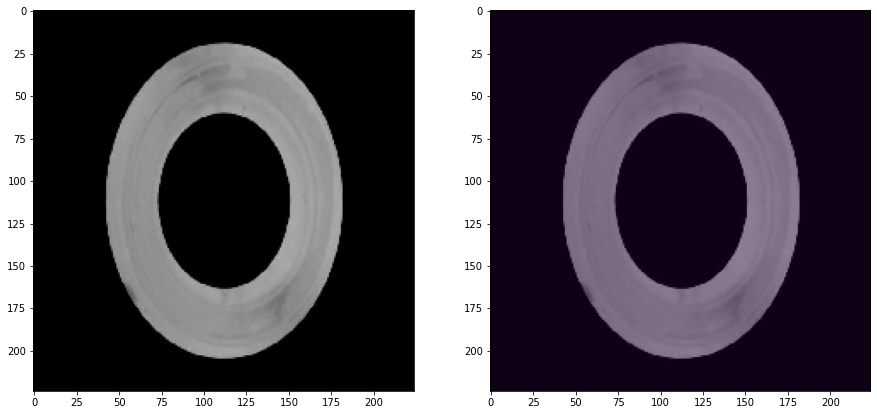

Threshold: 124204.609375 MaxValue: 84611.109375
GT: bien, anomaly detected: False


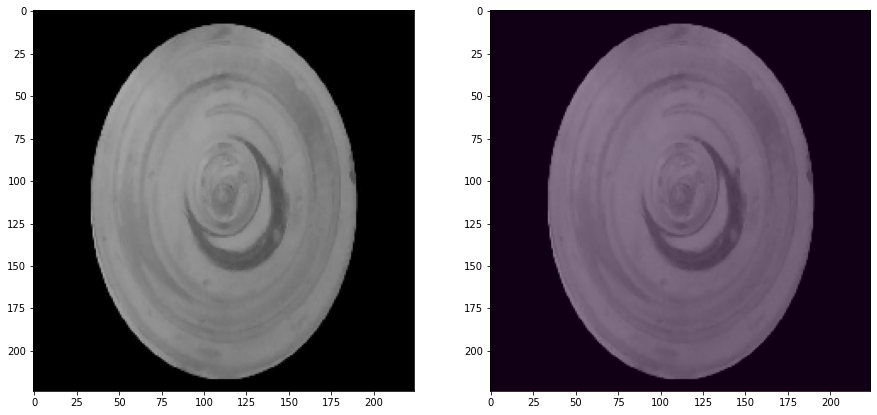

Threshold: 124204.609375 MaxValue: 91722.4609375
GT: bien, anomaly detected: False


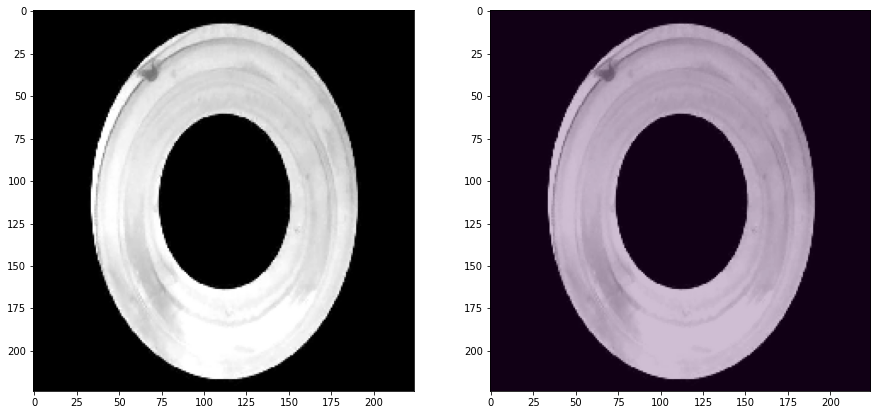

Threshold: 124204.609375 MaxValue: 121587.078125
GT: bien, anomaly detected: True


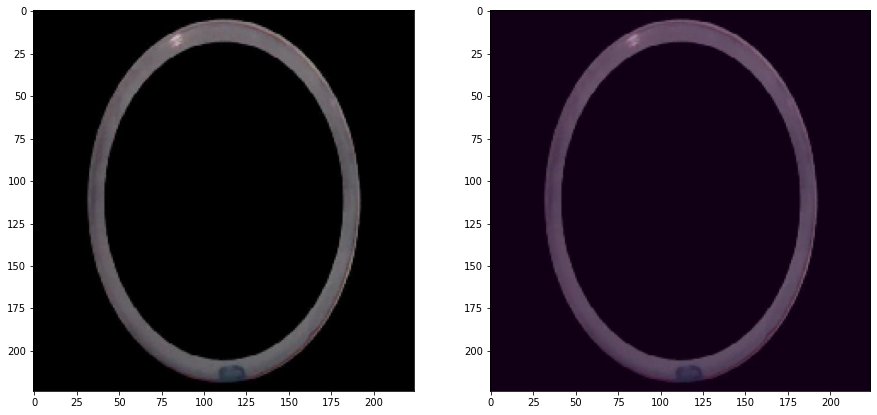

Threshold: 124204.609375 MaxValue: 95082.71875
GT: mal, anomaly detected: False


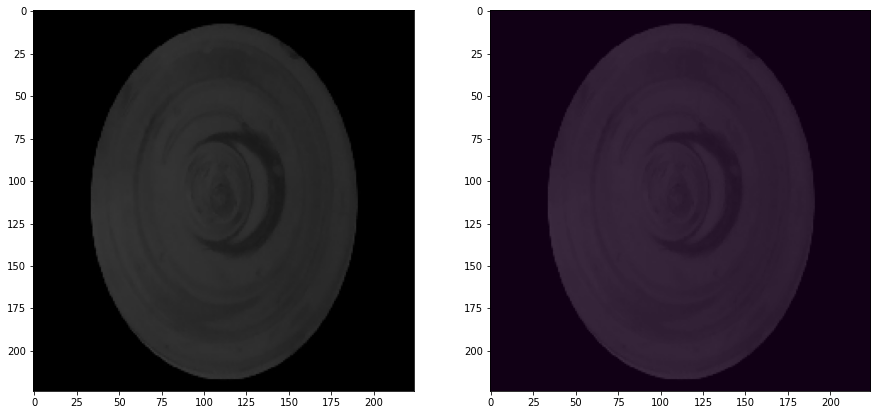

Threshold: 124204.609375 MaxValue: 56960.39453125
GT: mal, anomaly detected: False


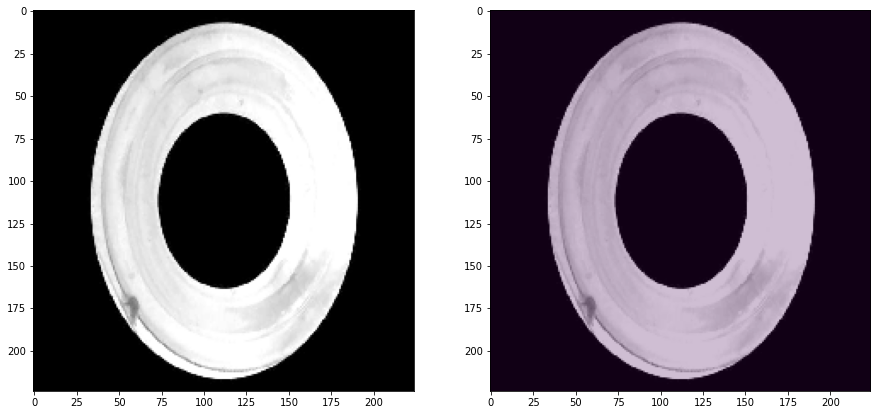

Threshold: 124204.609375 MaxValue: 123434.5625
GT: mal, anomaly detected: True


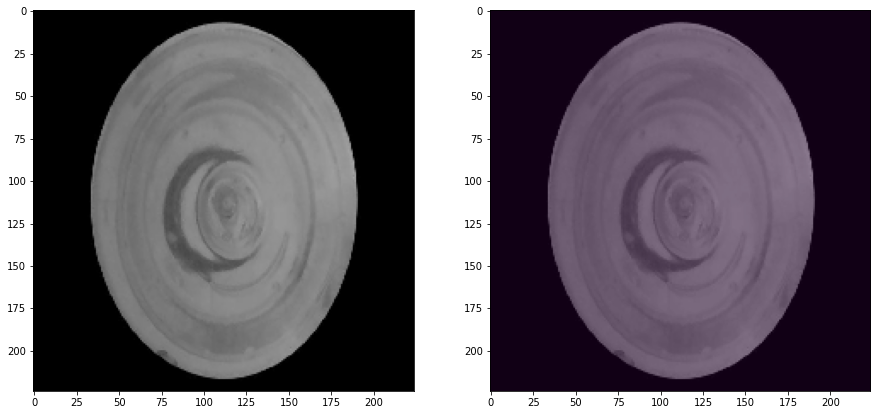

Threshold: 124204.609375 MaxValue: 92713.90625
GT: mal, anomaly detected: False


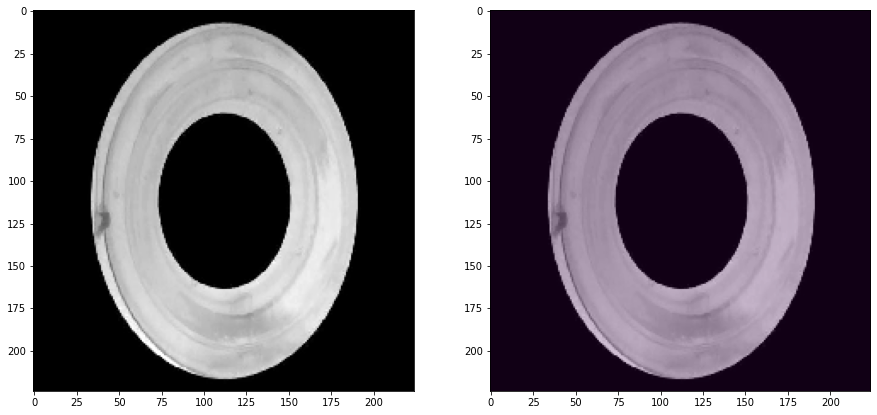

Threshold: 124204.609375 MaxValue: 109568.265625
GT: bien, anomaly detected: False


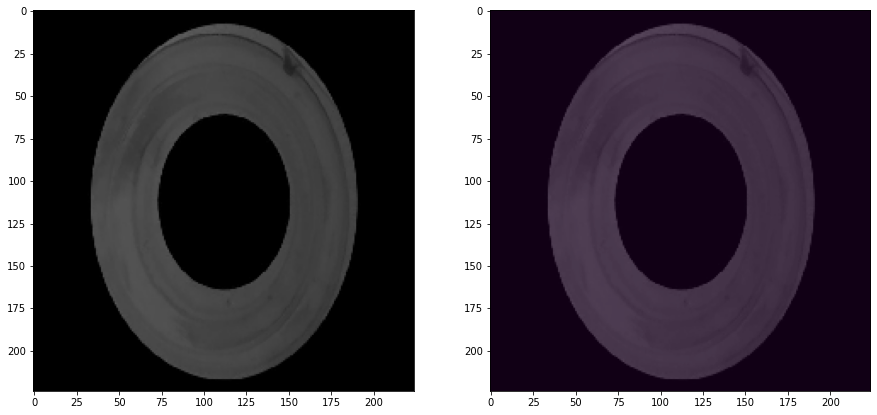

Threshold: 124204.609375 MaxValue: 59463.22265625
GT: bien, anomaly detected: False


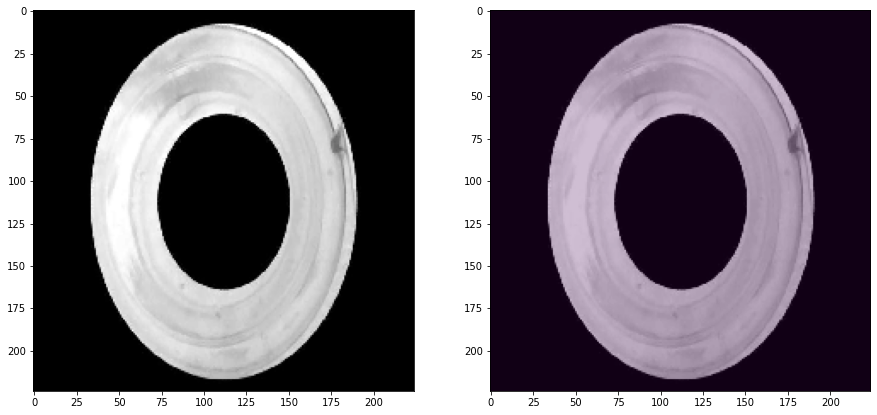

Threshold: 124204.609375 MaxValue: 116936.0703125
GT: mal, anomaly detected: False


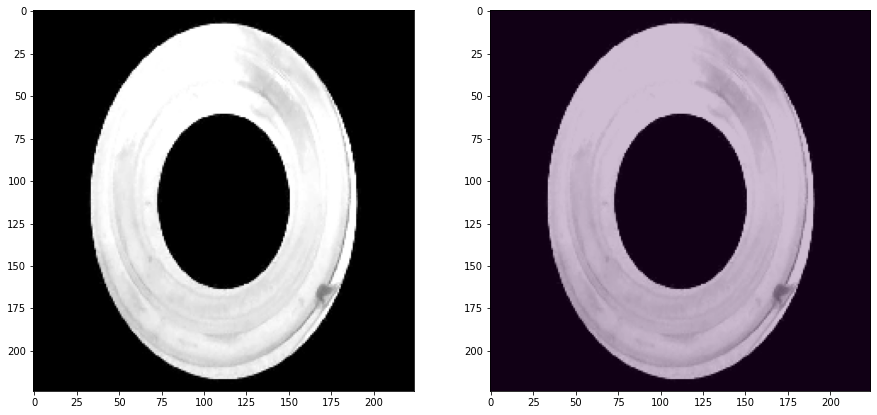

Threshold: 124204.609375 MaxValue: 122924.984375
GT: bien, anomaly detected: False


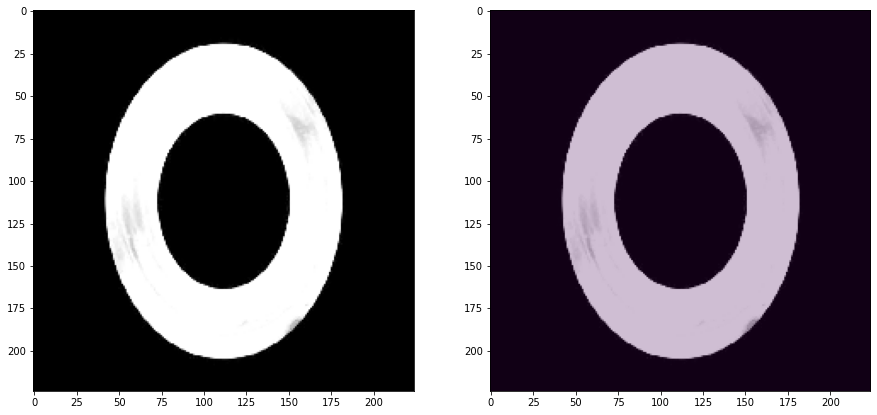

Threshold: 124204.609375 MaxValue: 122446.7265625
GT: mal, anomaly detected: False


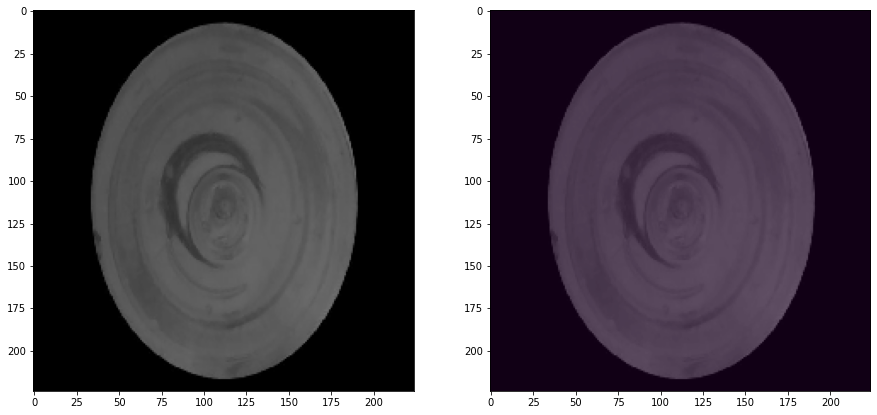

Threshold: 124204.609375 MaxValue: 65056.16796875
GT: bien, anomaly detected: False


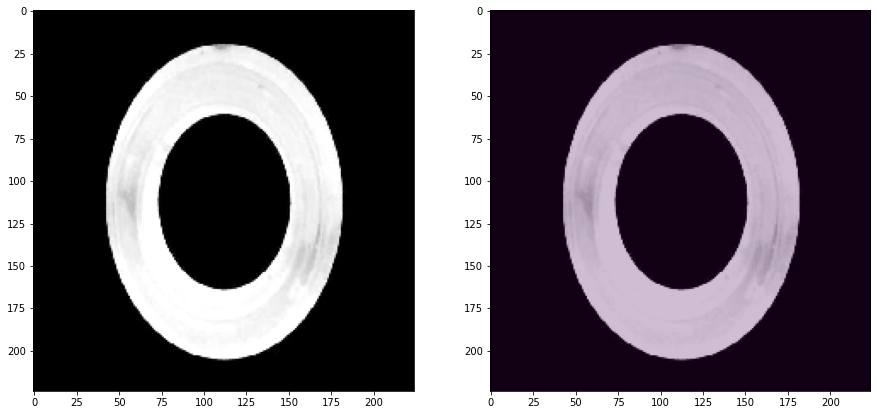

Threshold: 124204.609375 MaxValue: 120991.1640625
GT: bien, anomaly detected: False


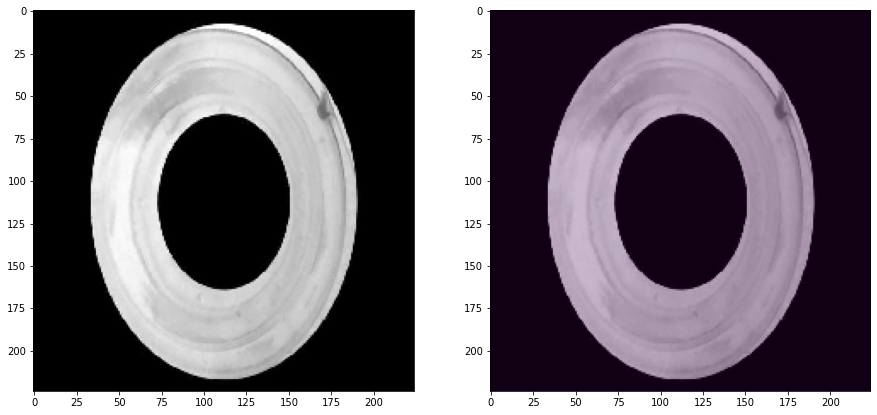

Threshold: 124204.609375 MaxValue: 107777.015625
GT: bien, anomaly detected: False


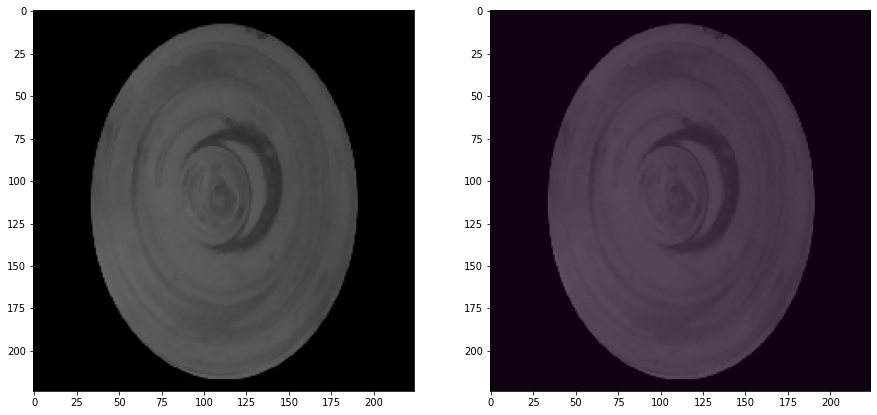

Threshold: 124204.609375 MaxValue: 68312.1015625
GT: bien, anomaly detected: False


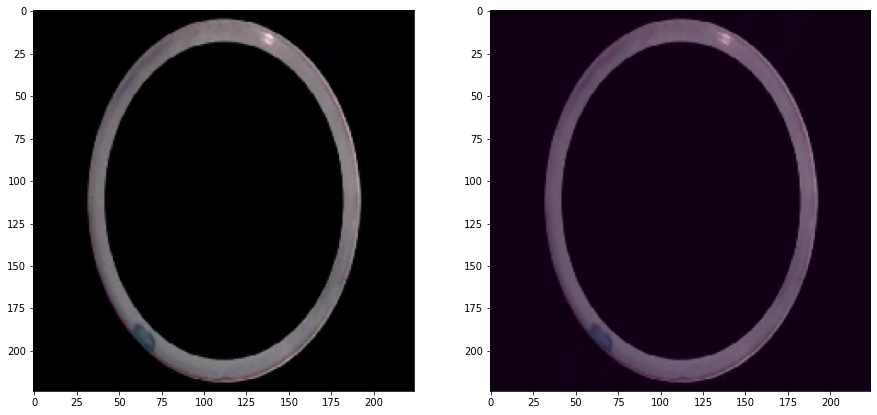

Threshold: 124204.609375 MaxValue: 120288.09375
GT: bien, anomaly detected: False


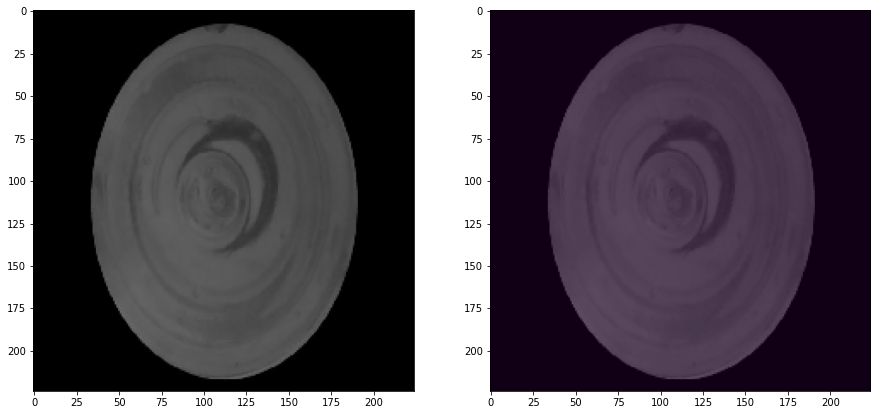

Threshold: 124204.609375 MaxValue: 67863.4140625
GT: mal, anomaly detected: False


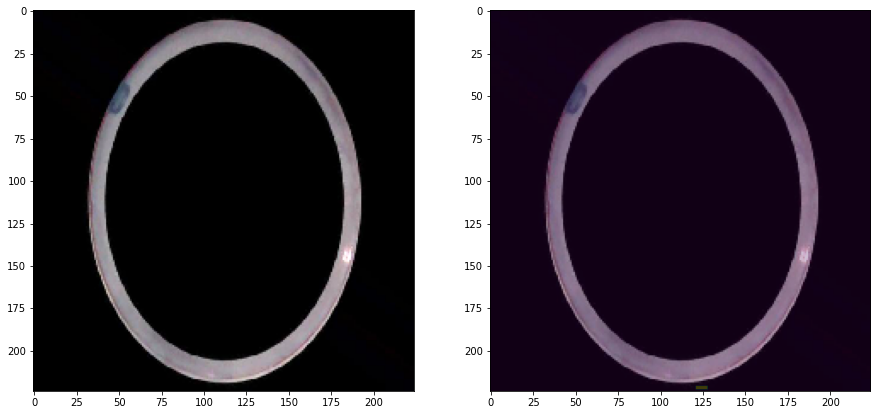

Threshold: 124204.609375 MaxValue: 125647.203125
GT: bien, anomaly detected: True


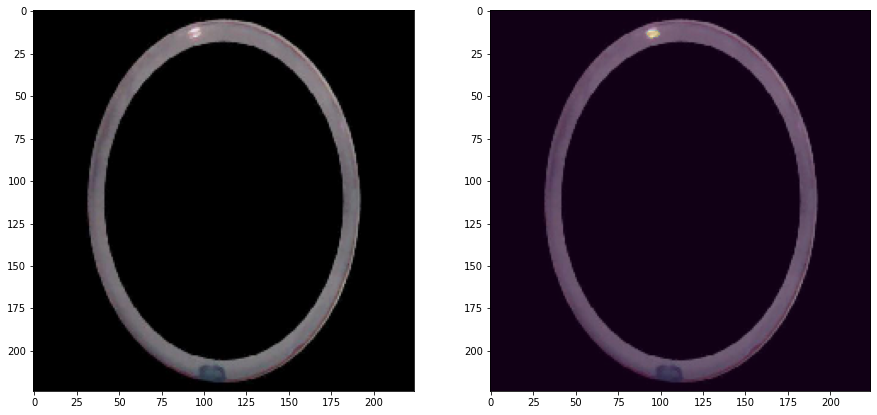

Threshold: 124204.609375 MaxValue: 136107.25
GT: bien, anomaly detected: True


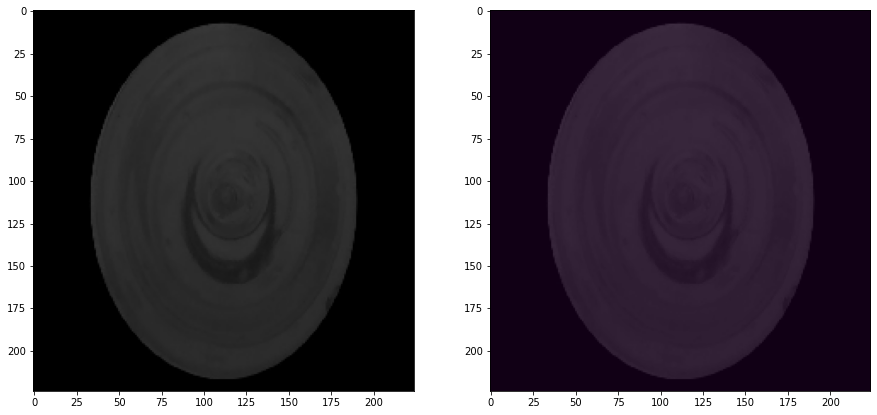

Threshold: 124204.609375 MaxValue: 56953.58203125
GT: mal, anomaly detected: False


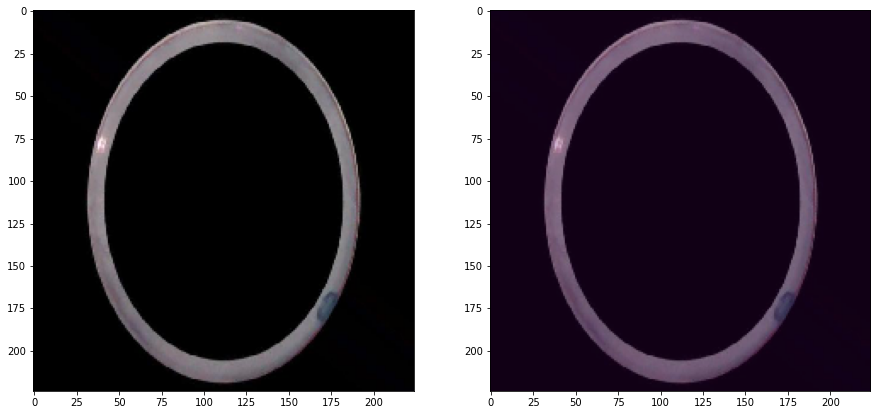

Threshold: 124204.609375 MaxValue: 109110.7265625
GT: mal, anomaly detected: False


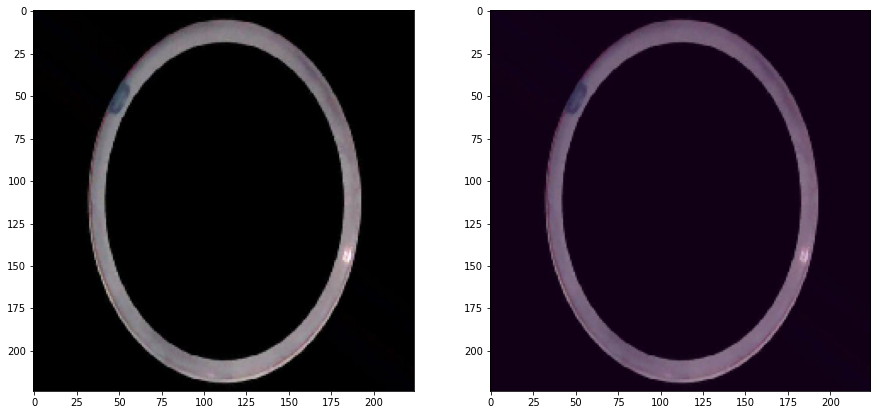

Threshold: 124204.609375 MaxValue: 117449.7890625
GT: mal, anomaly detected: False


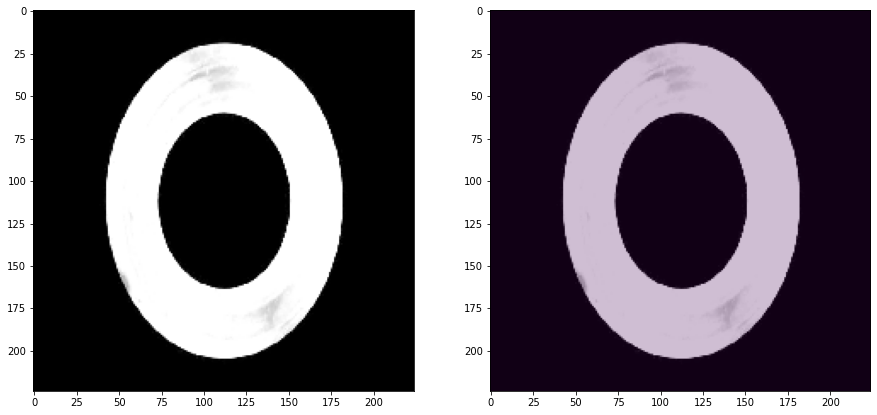

Threshold: 124204.609375 MaxValue: 123513.453125
GT: mal, anomaly detected: True


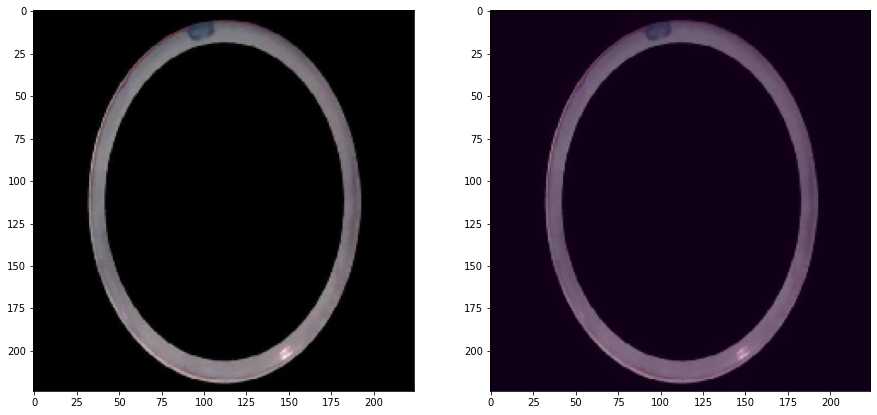

Threshold: 124204.609375 MaxValue: 112926.7578125
GT: bien, anomaly detected: False


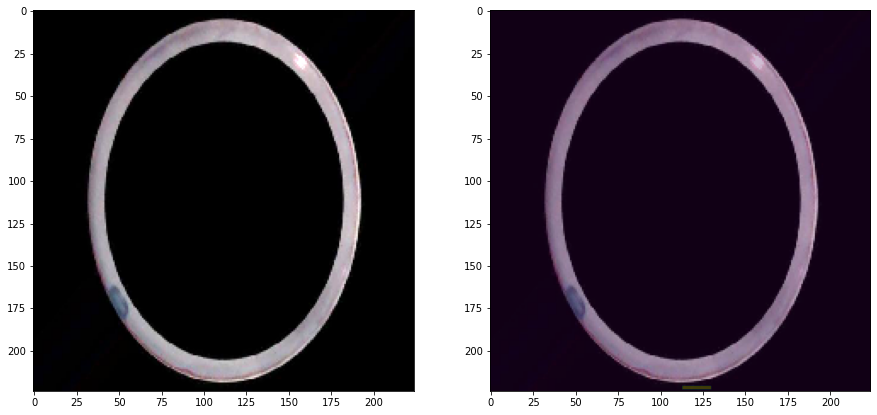

Threshold: 124204.609375 MaxValue: 129252.6875
GT: mal, anomaly detected: True


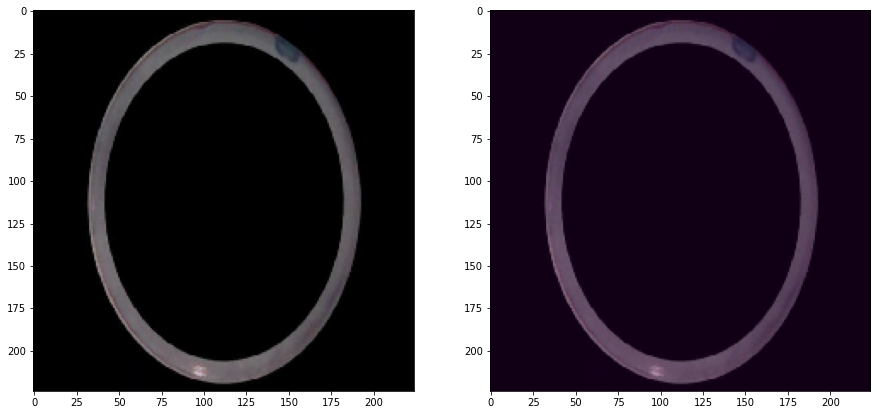

Threshold: 124204.609375 MaxValue: 99693.09375
GT: bien, anomaly detected: False


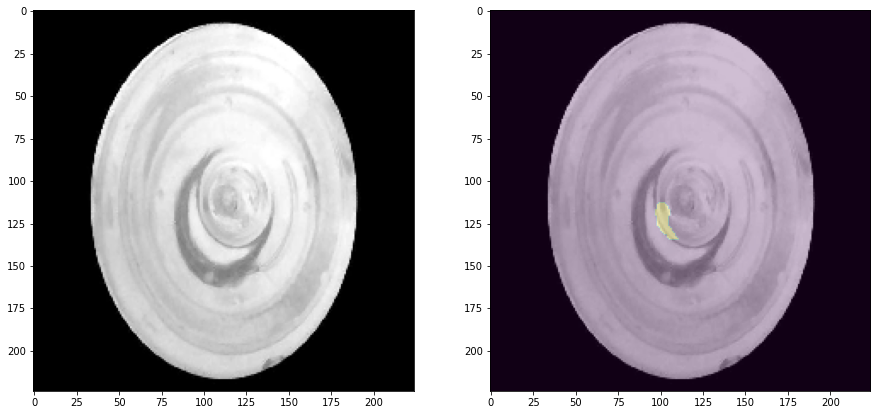

Threshold: 124204.609375 MaxValue: 130087.9140625
GT: bien, anomaly detected: True


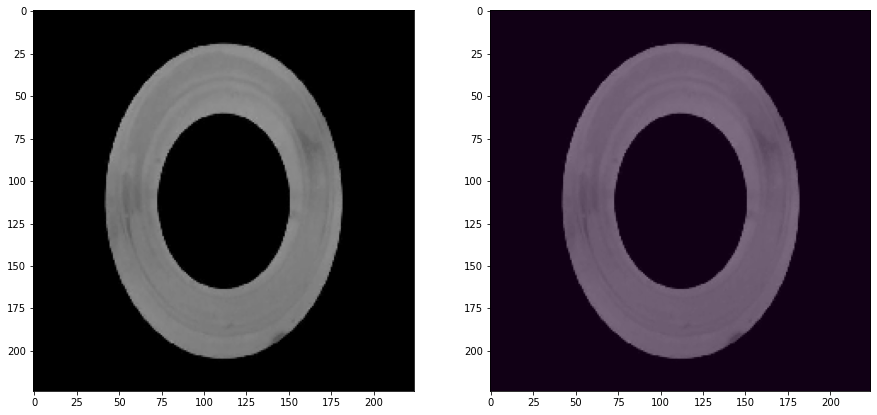

Threshold: 124204.609375 MaxValue: 79971.375
GT: mal, anomaly detected: False


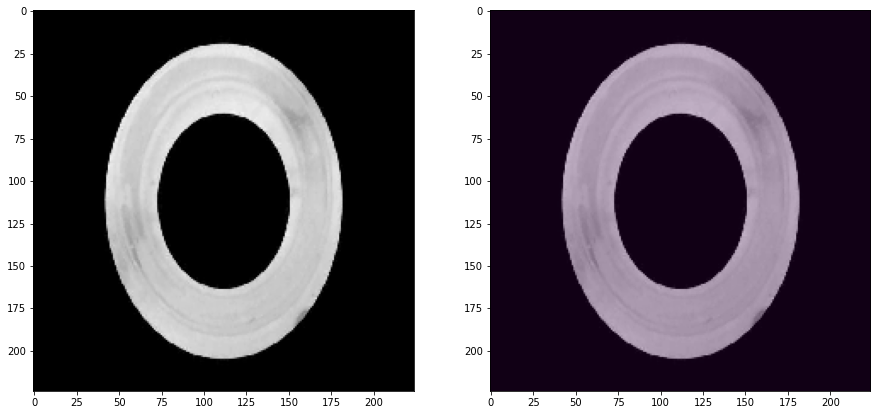

Threshold: 124204.609375 MaxValue: 111233.9375
GT: mal, anomaly detected: False


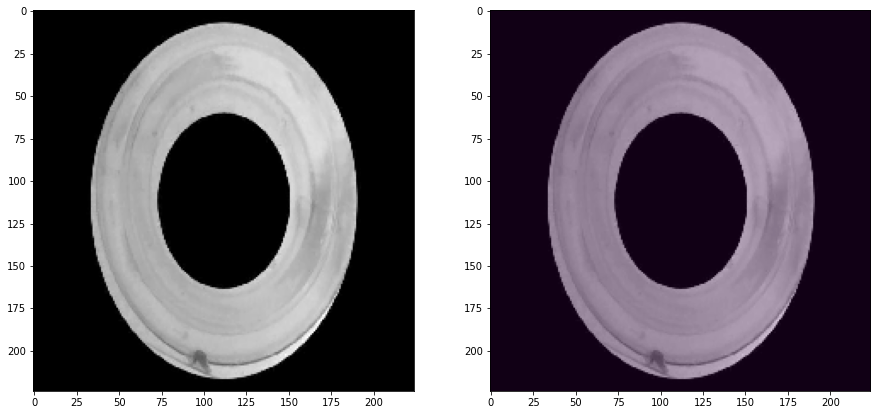

Threshold: 124204.609375 MaxValue: 111678.6953125
GT: bien, anomaly detected: False


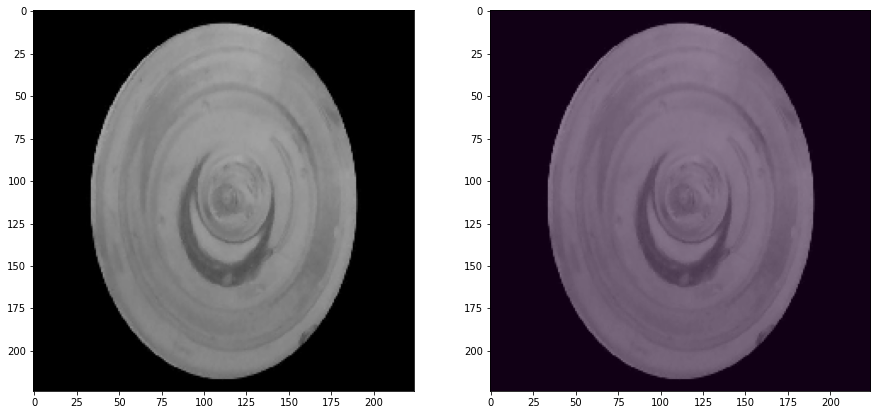

Threshold: 124204.609375 MaxValue: 83250.5703125
GT: mal, anomaly detected: False


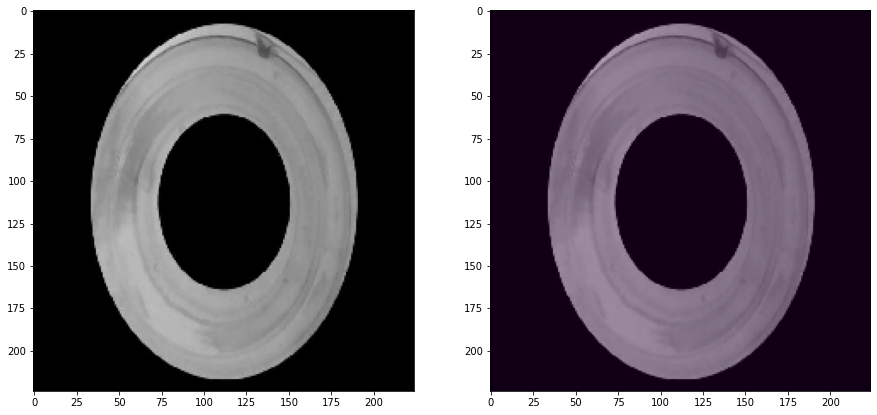

Threshold: 124204.609375 MaxValue: 97574.6328125
GT: bien, anomaly detected: False


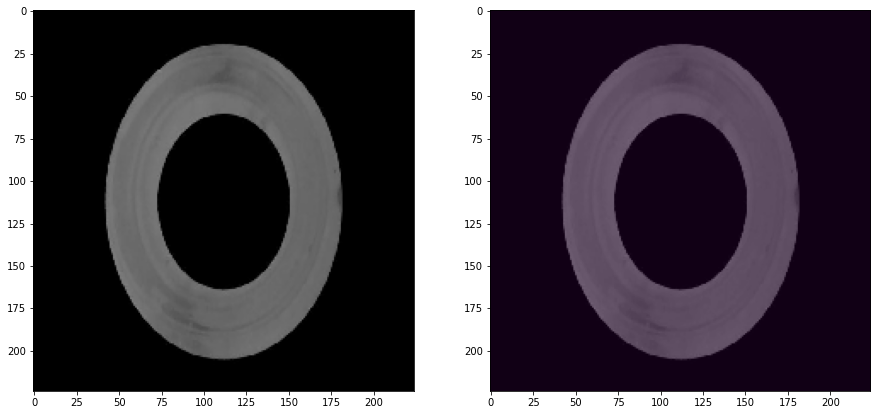

Threshold: 124204.609375 MaxValue: 71765.234375
GT: bien, anomaly detected: False


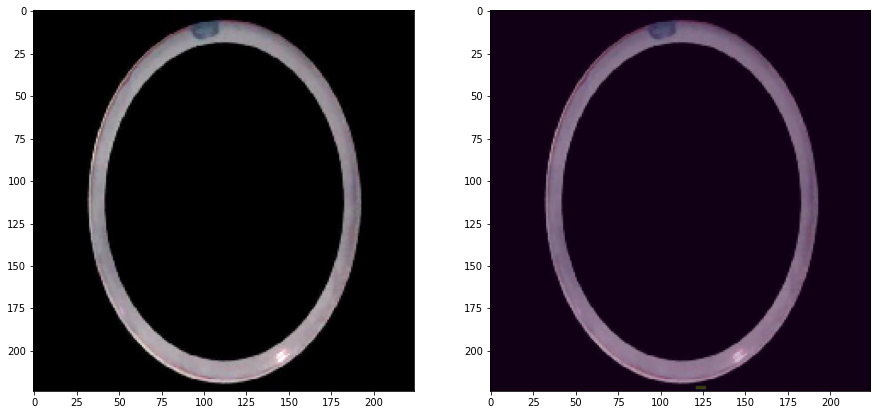

Threshold: 124204.609375 MaxValue: 124802.8671875
GT: bien, anomaly detected: True


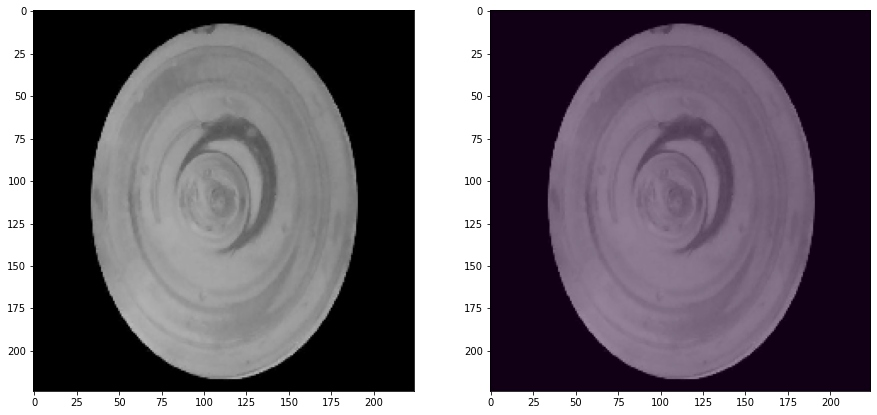

Threshold: 124204.609375 MaxValue: 92881.0078125
GT: bien, anomaly detected: False


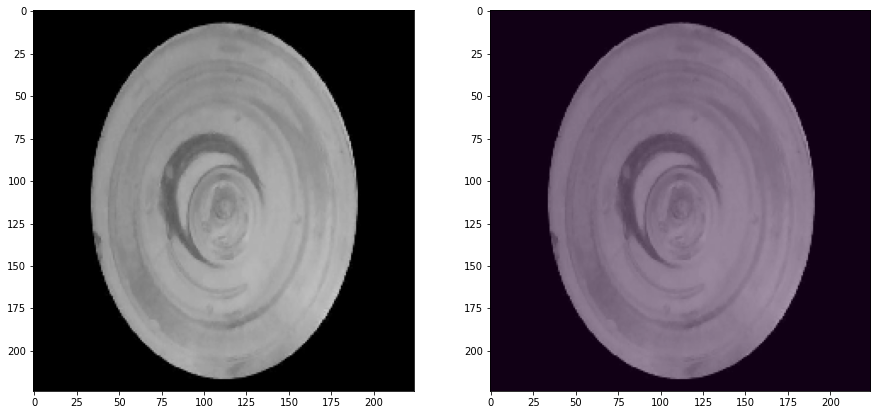

Threshold: 124204.609375 MaxValue: 116194.59375
GT: bien, anomaly detected: False


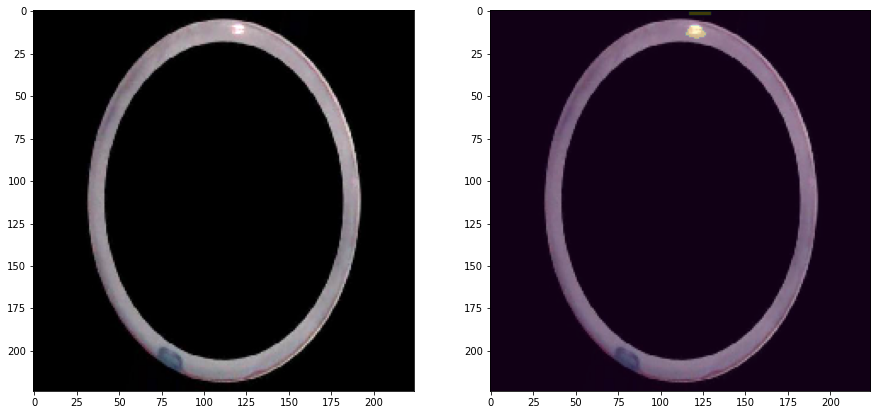

Threshold: 124204.609375 MaxValue: 141241.640625
GT: bien, anomaly detected: True


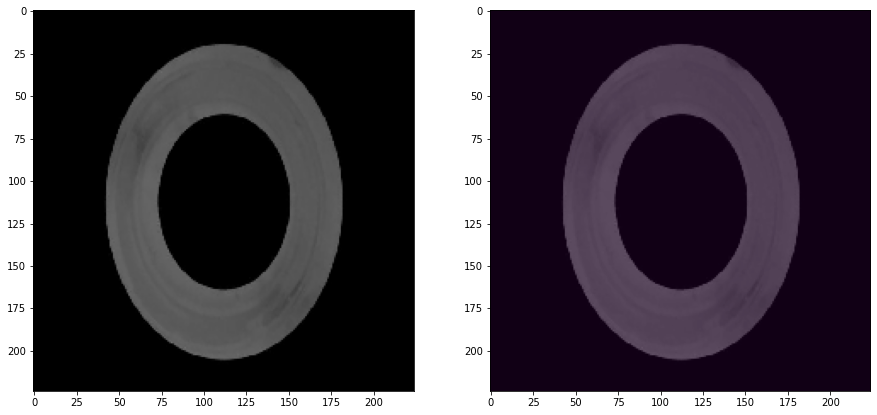

Threshold: 124204.609375 MaxValue: 62533.90234375
GT: bien, anomaly detected: False


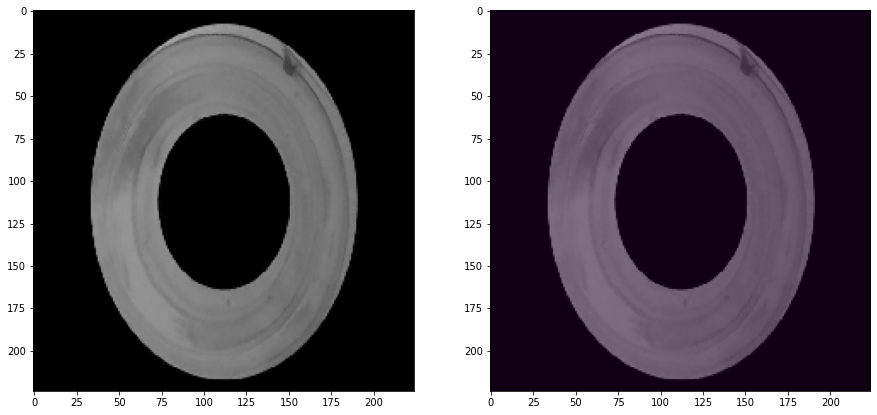

Threshold: 124204.609375 MaxValue: 78362.359375
GT: mal, anomaly detected: False


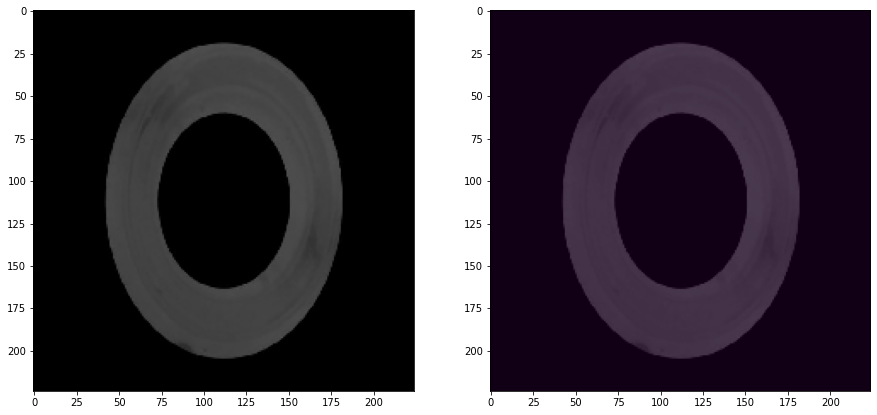

Threshold: 124204.609375 MaxValue: 56930.13671875
GT: bien, anomaly detected: False


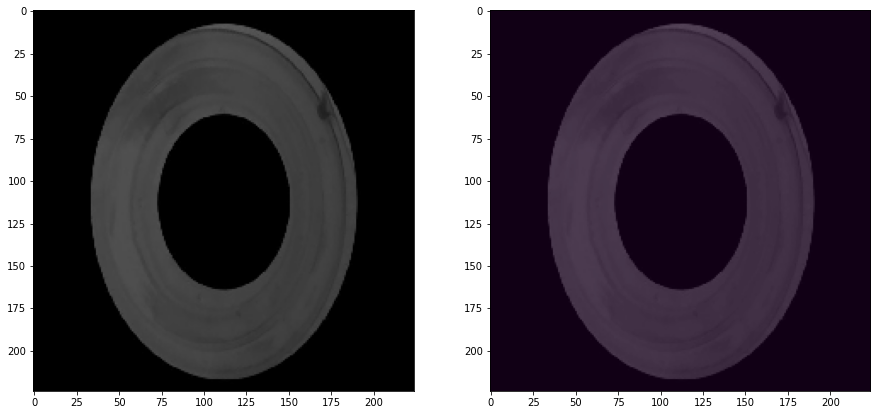

Threshold: 124204.609375 MaxValue: 59441.40234375
GT: mal, anomaly detected: False


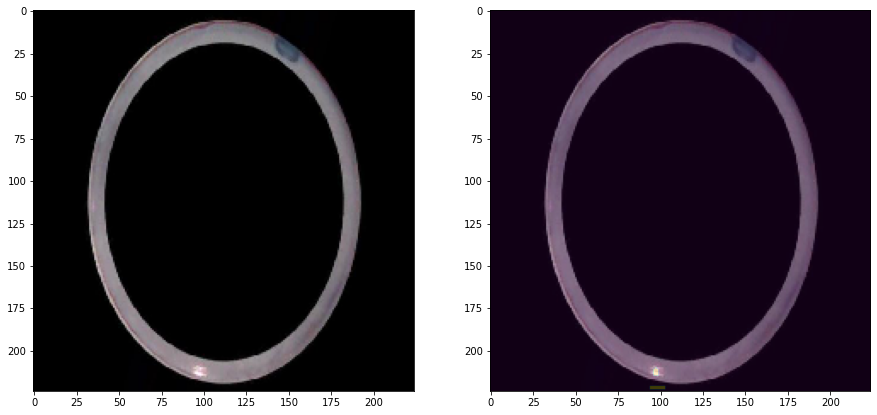

Threshold: 124204.609375 MaxValue: 128340.2265625
GT: mal, anomaly detected: True


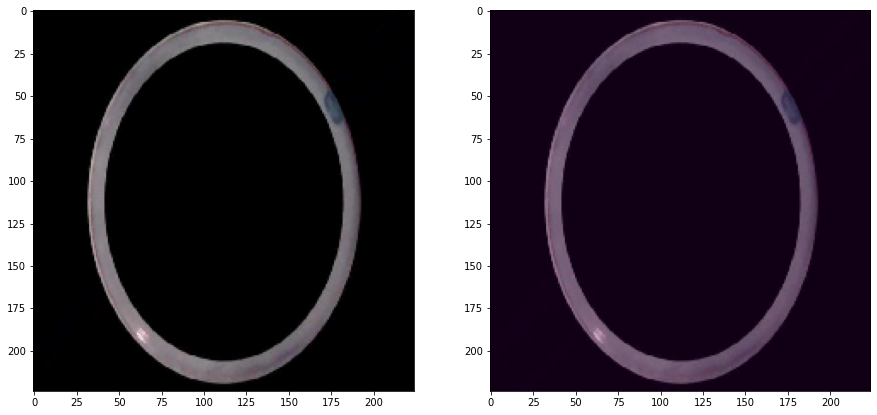

Threshold: 124204.609375 MaxValue: 101422.3671875
GT: bien, anomaly detected: False


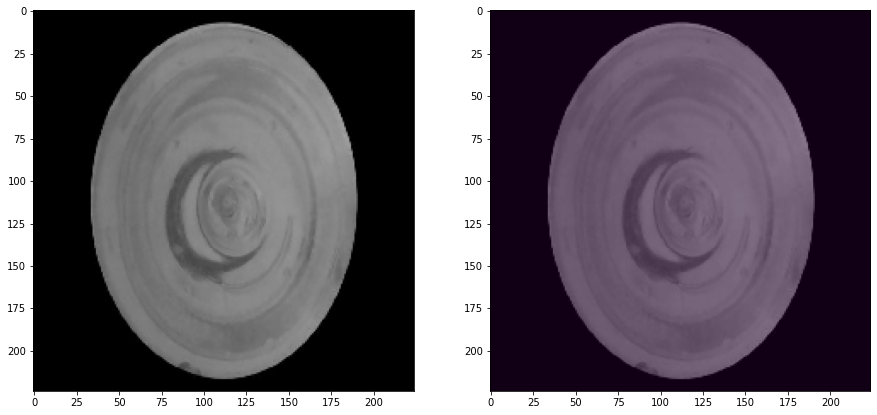

Threshold: 124204.609375 MaxValue: 89069.28125
GT: mal, anomaly detected: False


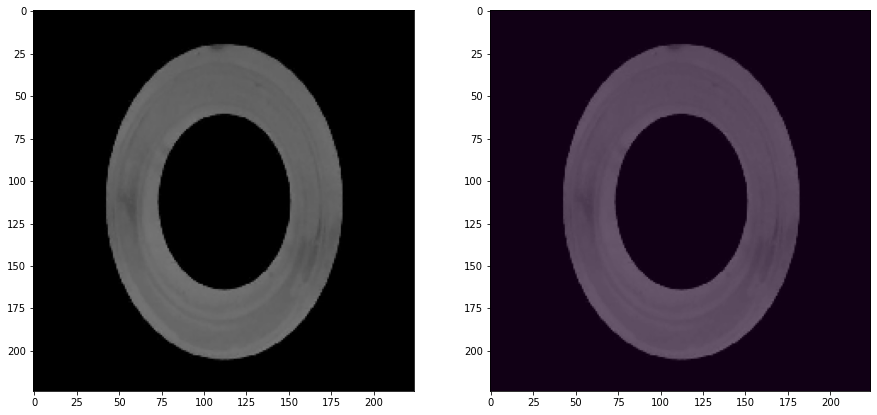

Threshold: 124204.609375 MaxValue: 69966.8125
GT: mal, anomaly detected: False


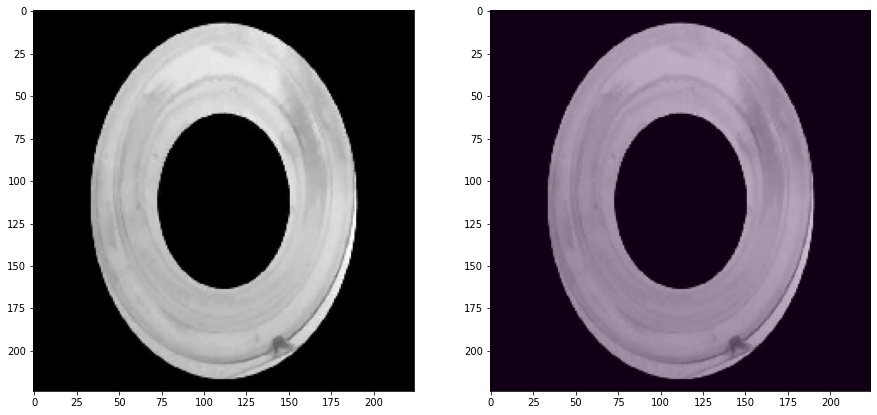

Threshold: 124204.609375 MaxValue: 113275.609375
GT: bien, anomaly detected: False


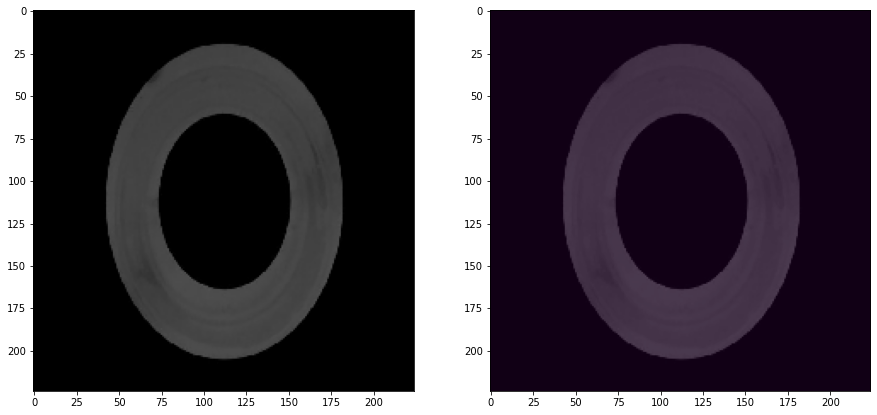

Threshold: 124204.609375 MaxValue: 56931.390625
GT: bien, anomaly detected: False


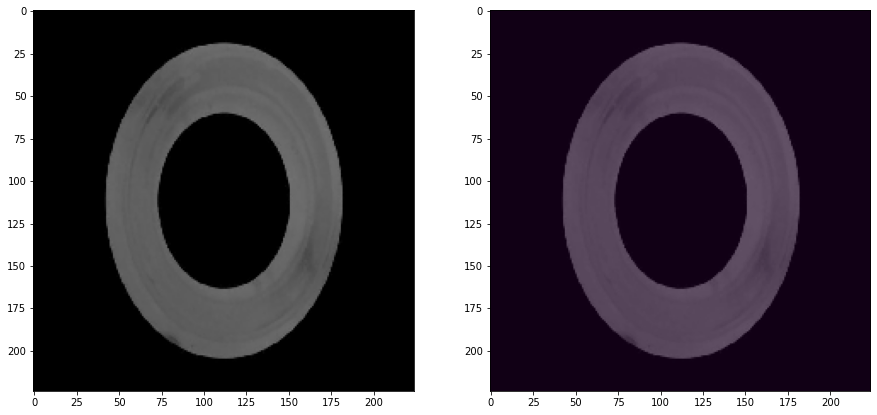

Threshold: 124204.609375 MaxValue: 66778.1796875
GT: bien, anomaly detected: False


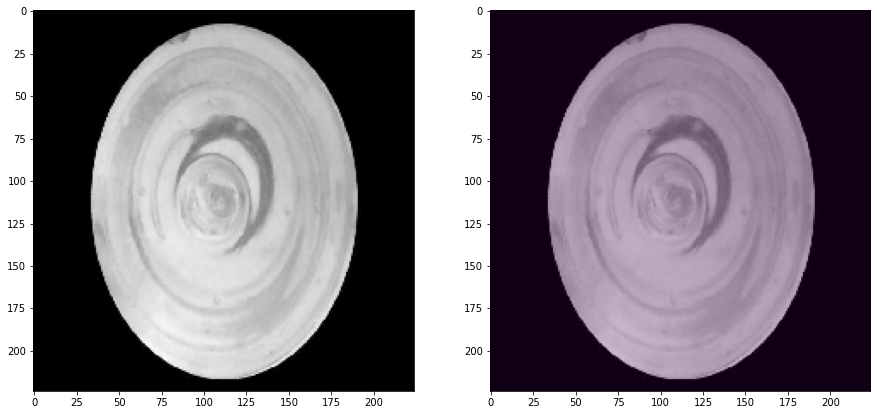

Threshold: 124204.609375 MaxValue: 115372.7734375
GT: mal, anomaly detected: False


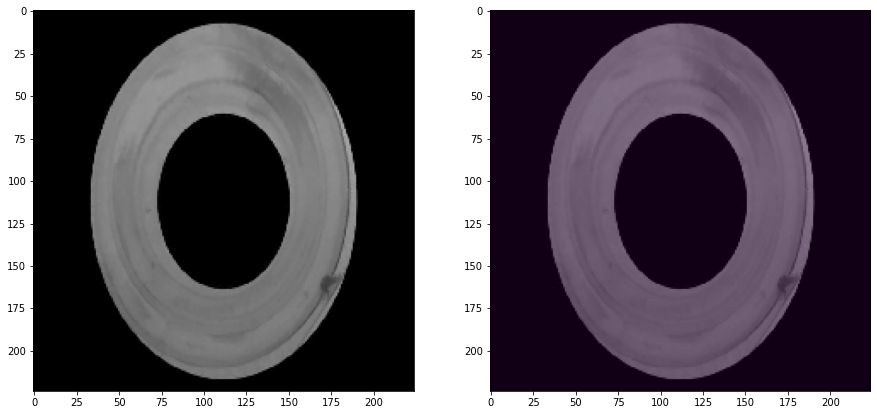

Threshold: 124204.609375 MaxValue: 79129.171875
GT: mal, anomaly detected: False


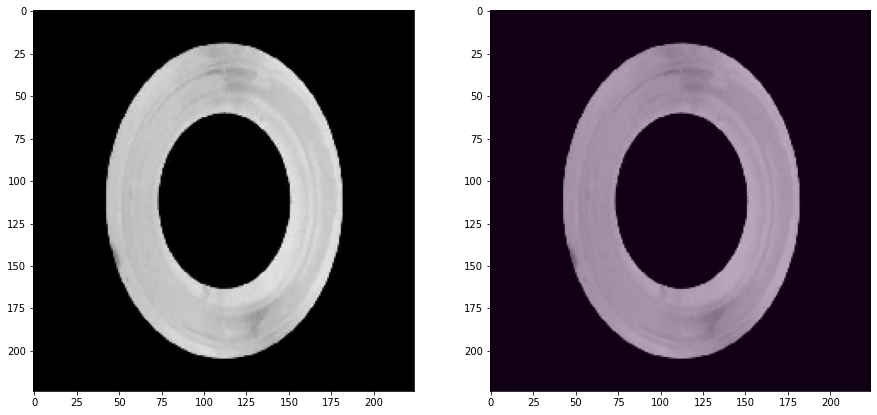

Threshold: 124204.609375 MaxValue: 109192.8125
GT: mal, anomaly detected: False


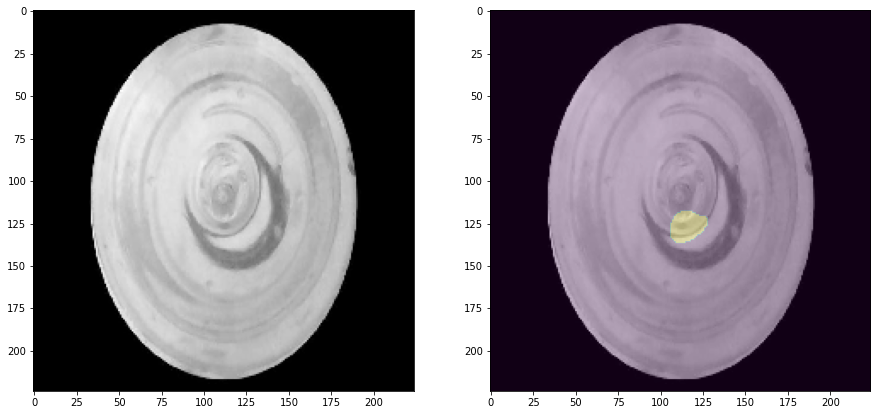

Threshold: 124204.609375 MaxValue: 150258.140625
GT: mal, anomaly detected: True


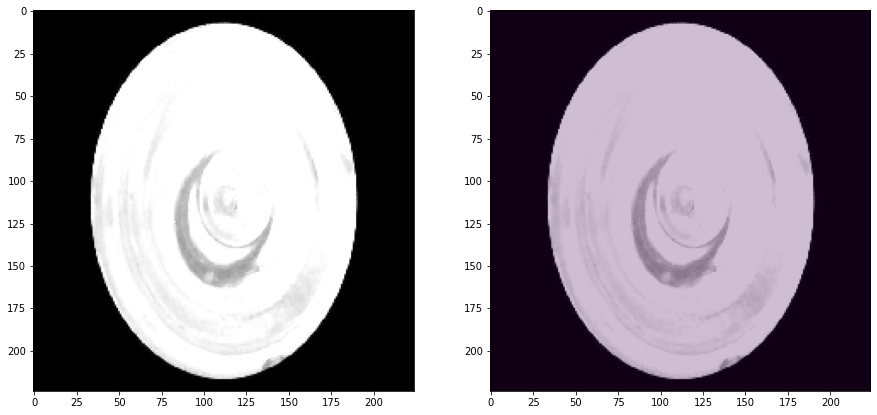

Threshold: 124204.609375 MaxValue: 111024.3046875
GT: mal, anomaly detected: False


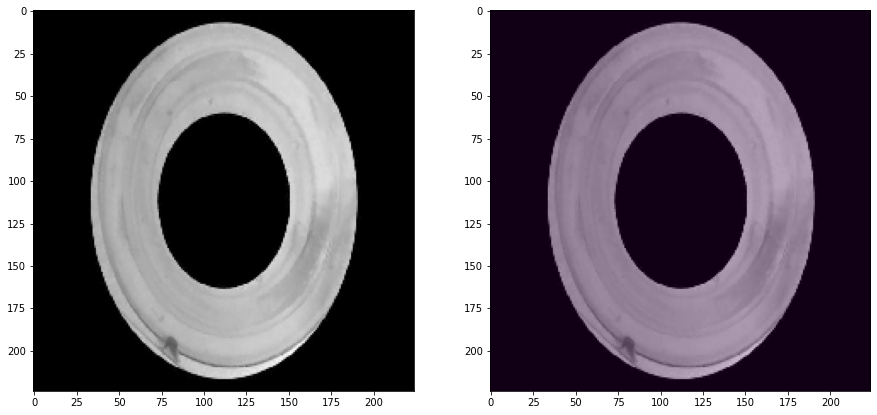

Threshold: 124204.609375 MaxValue: 109807.1171875
GT: bien, anomaly detected: False


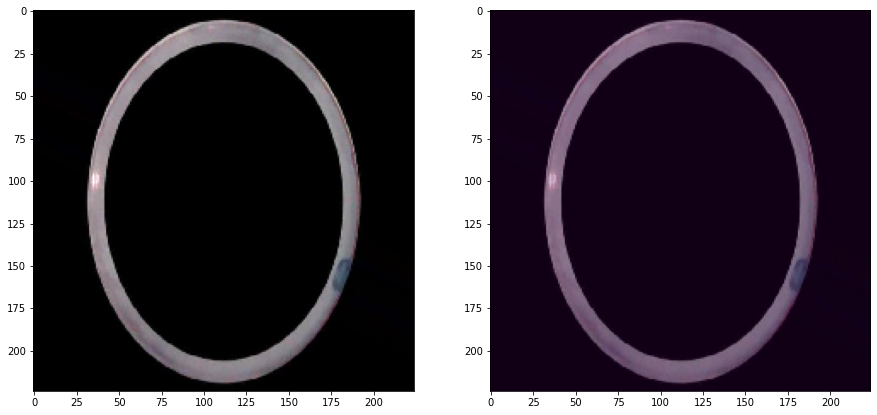

Threshold: 124204.609375 MaxValue: 100494.21875
GT: mal, anomaly detected: False


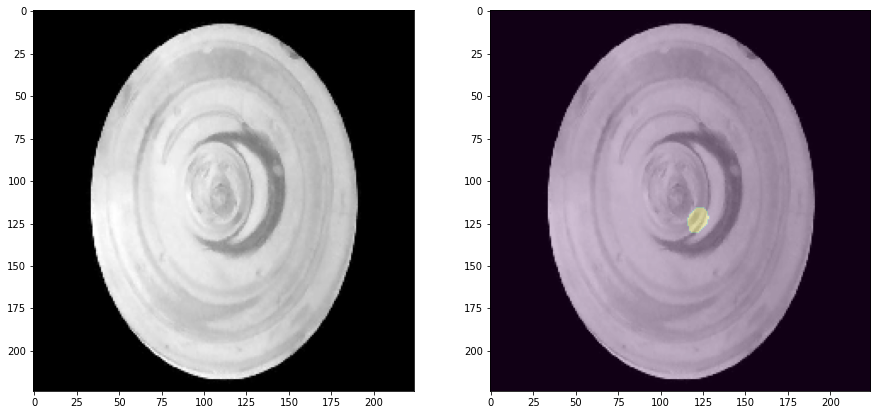

Threshold: 124204.609375 MaxValue: 138396.40625
GT: bien, anomaly detected: True


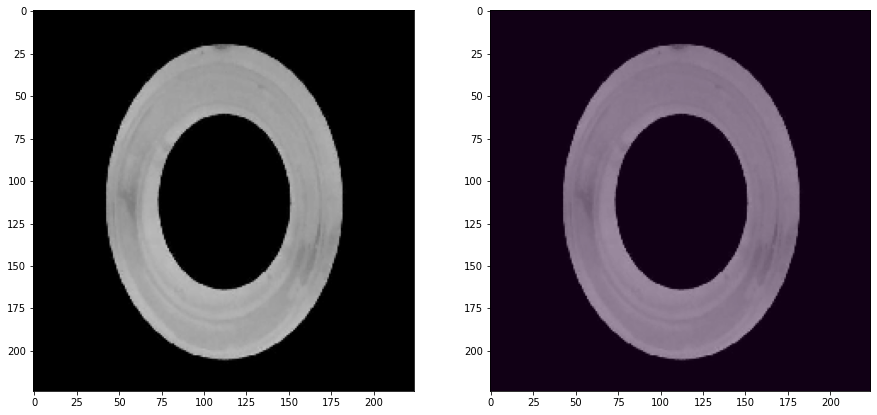

Threshold: 124204.609375 MaxValue: 91956.15625
GT: mal, anomaly detected: False


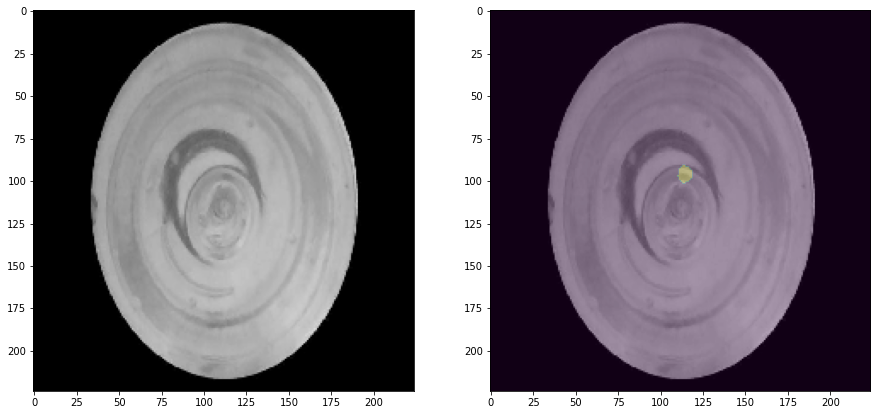

Threshold: 124204.609375 MaxValue: 132059.921875
GT: mal, anomaly detected: True


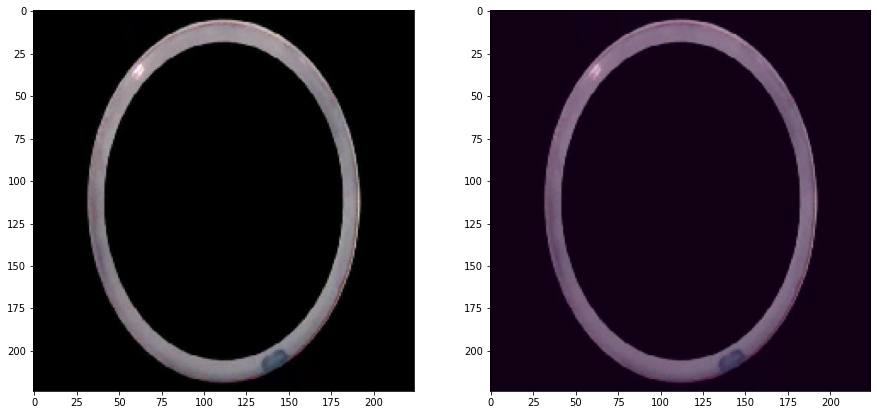

Threshold: 124204.609375 MaxValue: 115853.703125
GT: bien, anomaly detected: False


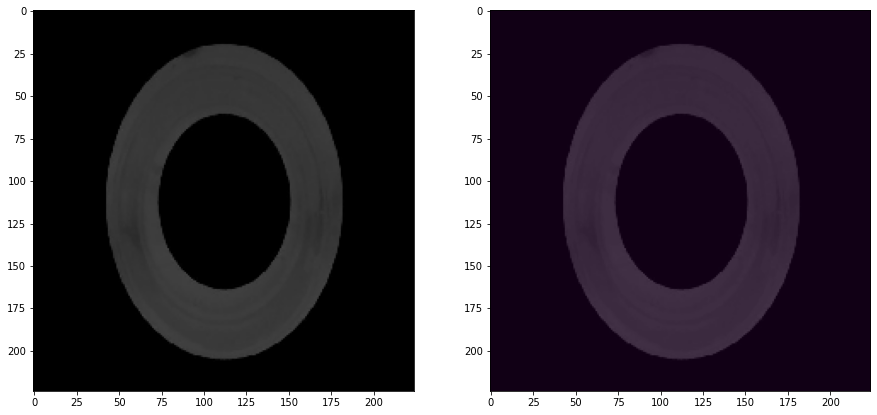

Threshold: 124204.609375 MaxValue: 56930.24609375
GT: mal, anomaly detected: False


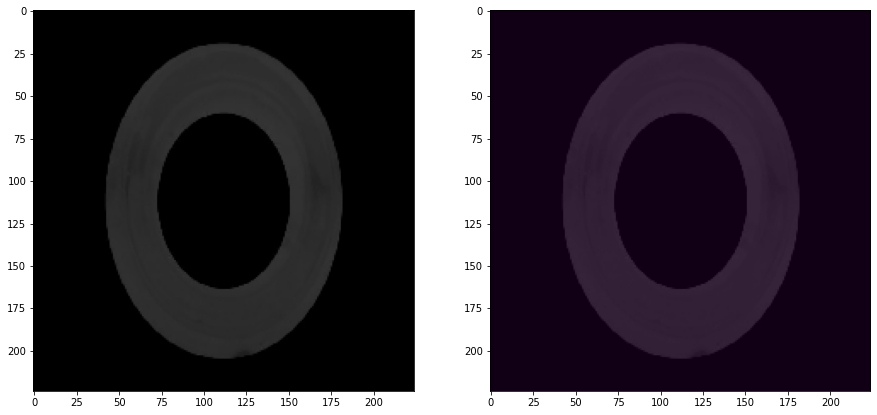

Threshold: 124204.609375 MaxValue: 56925.54296875
GT: bien, anomaly detected: False


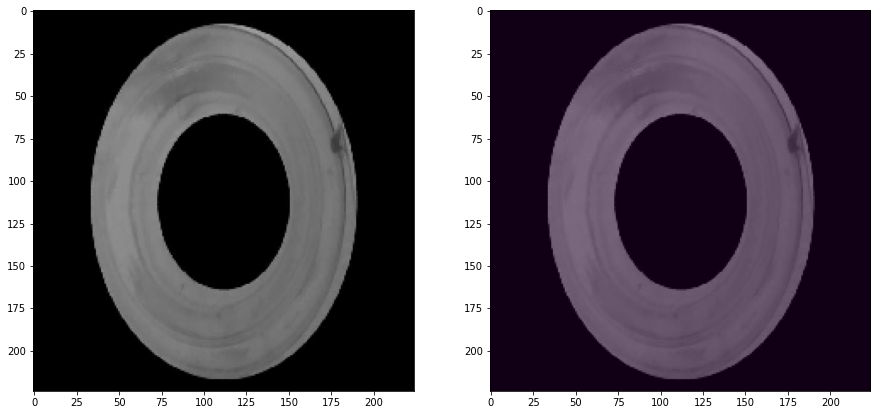

Threshold: 124204.609375 MaxValue: 76617.3515625
GT: bien, anomaly detected: False


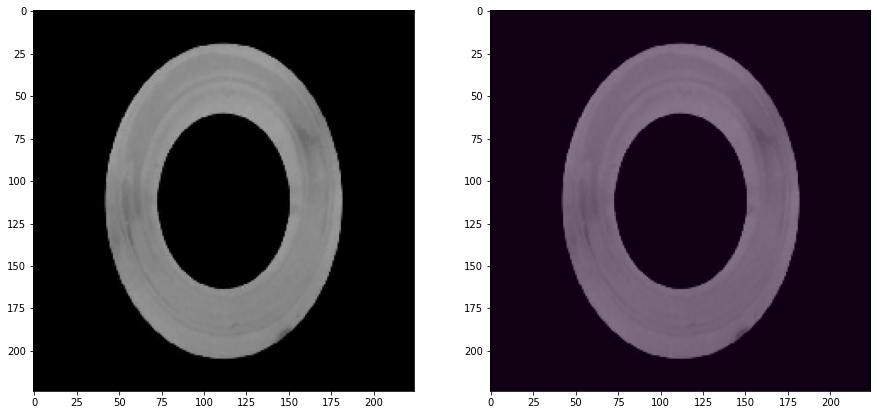

Threshold: 124204.609375 MaxValue: 85640.59375
GT: bien, anomaly detected: False


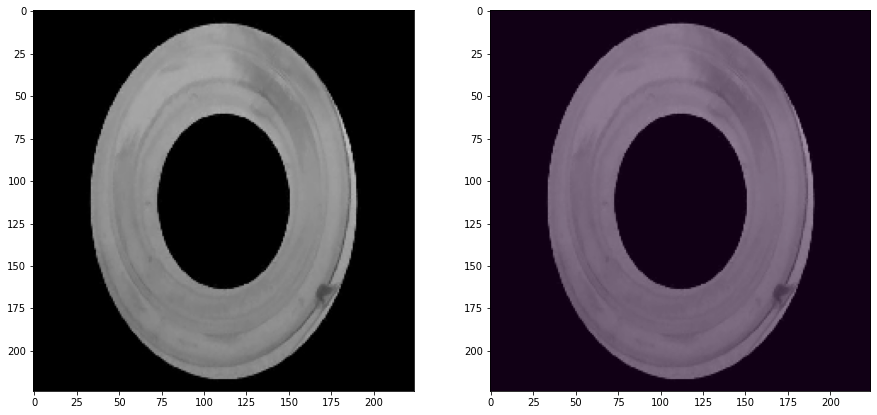

Threshold: 124204.609375 MaxValue: 86760.8515625
GT: mal, anomaly detected: False


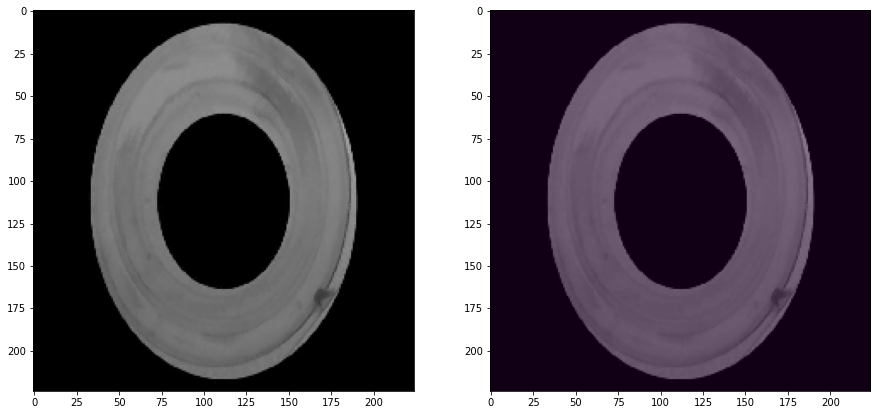

Threshold: 124204.609375 MaxValue: 77301.203125
GT: bien, anomaly detected: False


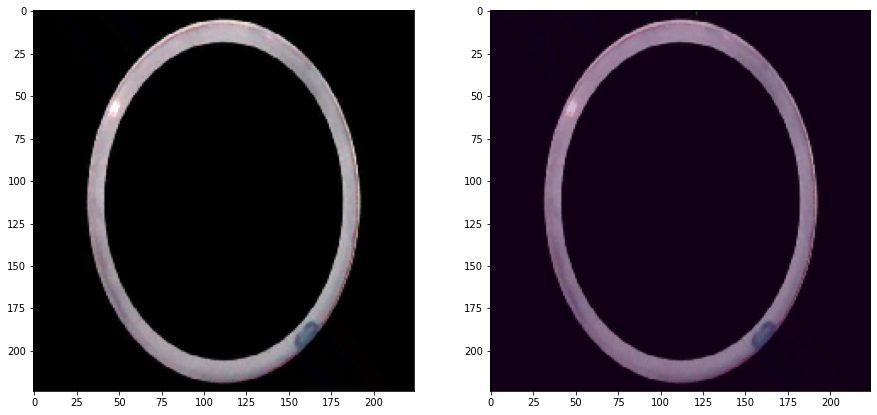

Threshold: 124204.609375 MaxValue: 124268.3515625
GT: bien, anomaly detected: True


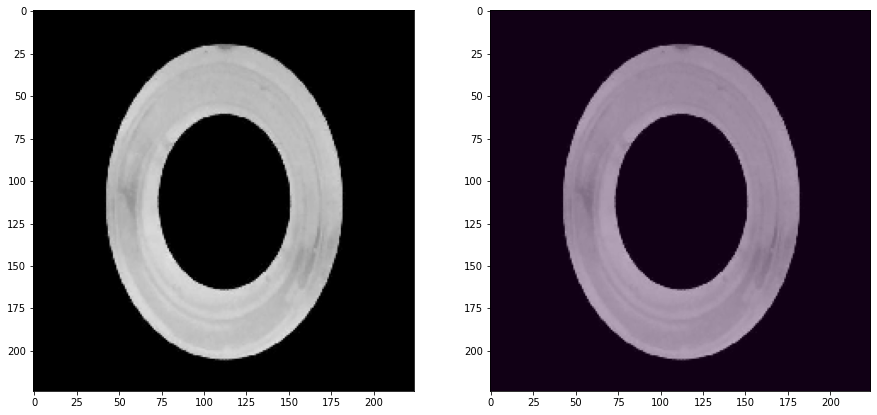

Threshold: 124204.609375 MaxValue: 103537.75
GT: mal, anomaly detected: False


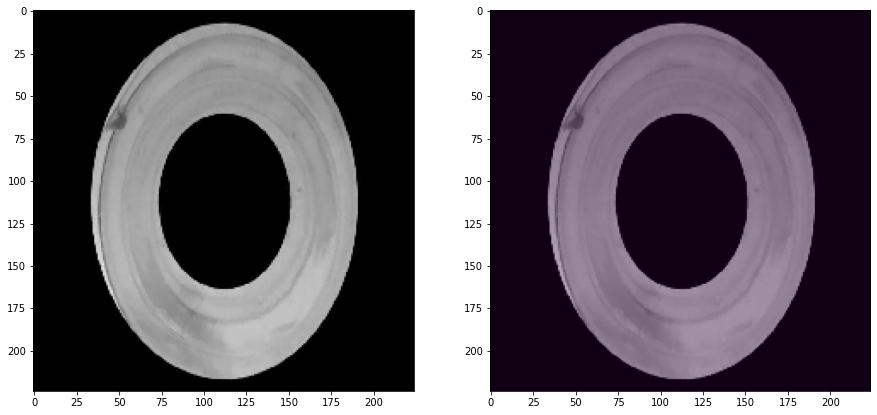

Threshold: 124204.609375 MaxValue: 99679.90625
GT: bien, anomaly detected: False


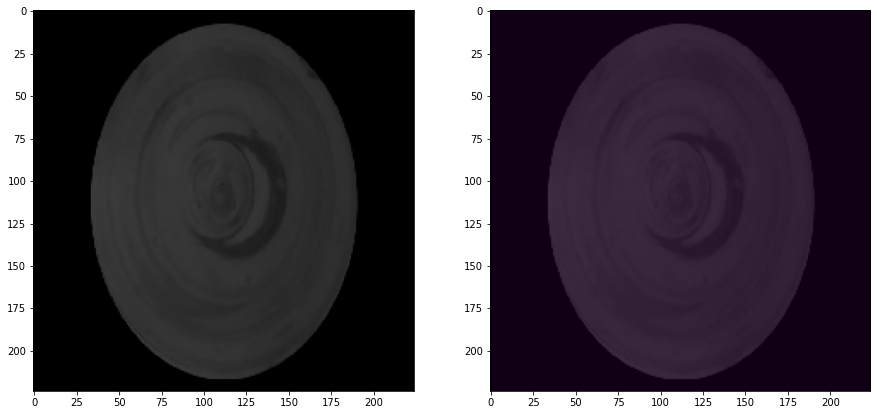

Threshold: 124204.609375 MaxValue: 56963.9765625
GT: mal, anomaly detected: False


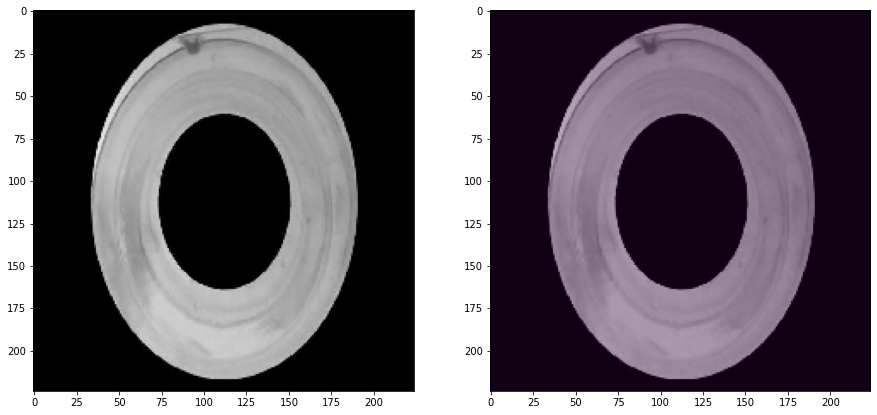

Threshold: 124204.609375 MaxValue: 101864.9453125
GT: mal, anomaly detected: False


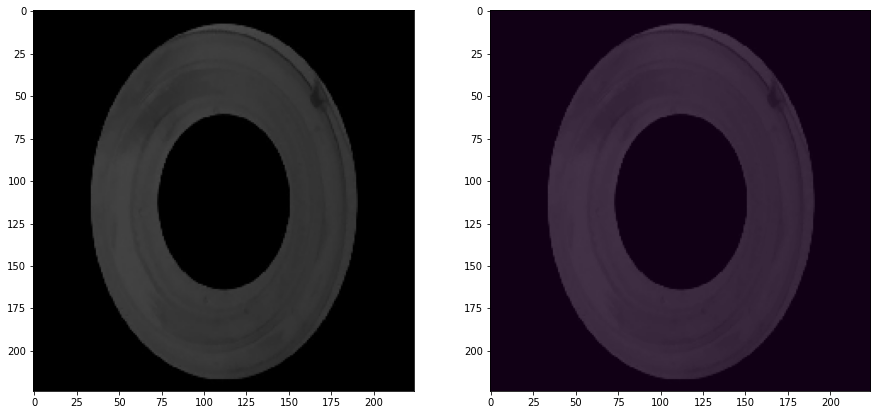

Threshold: 124204.609375 MaxValue: 56970.4296875
GT: mal, anomaly detected: False


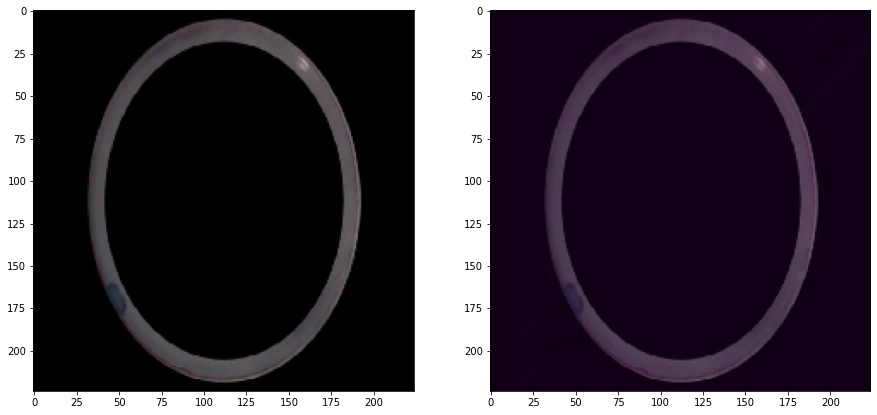

Threshold: 124204.609375 MaxValue: 78807.8359375
GT: bien, anomaly detected: False


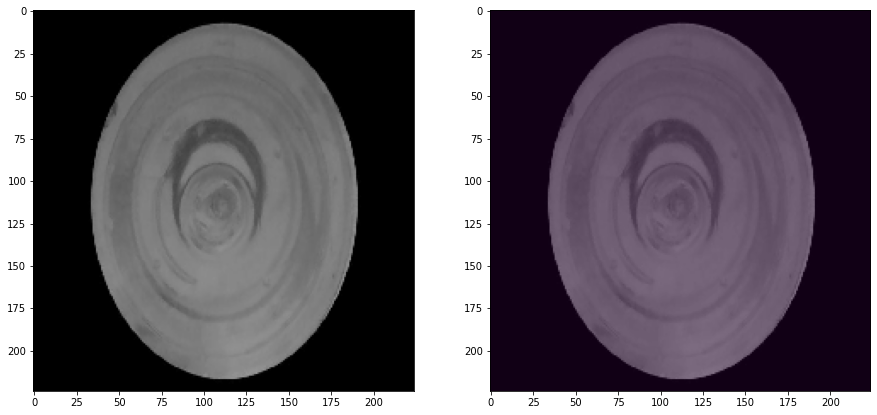

Threshold: 124204.609375 MaxValue: 86634.609375
GT: mal, anomaly detected: False


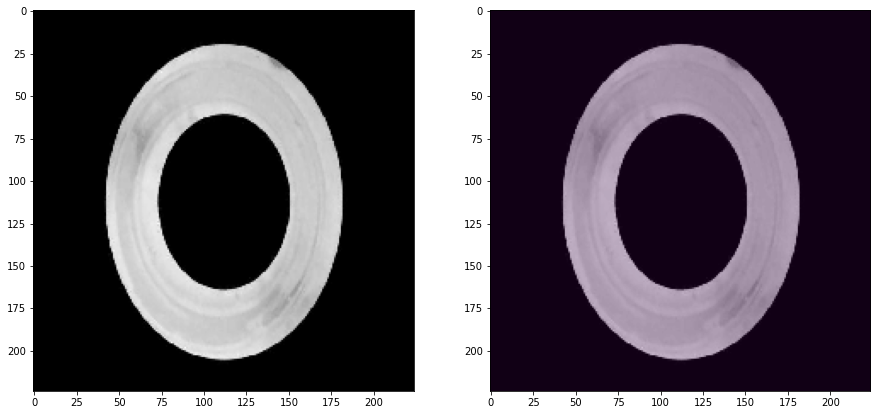

Threshold: 124204.609375 MaxValue: 105922.5546875
GT: mal, anomaly detected: False


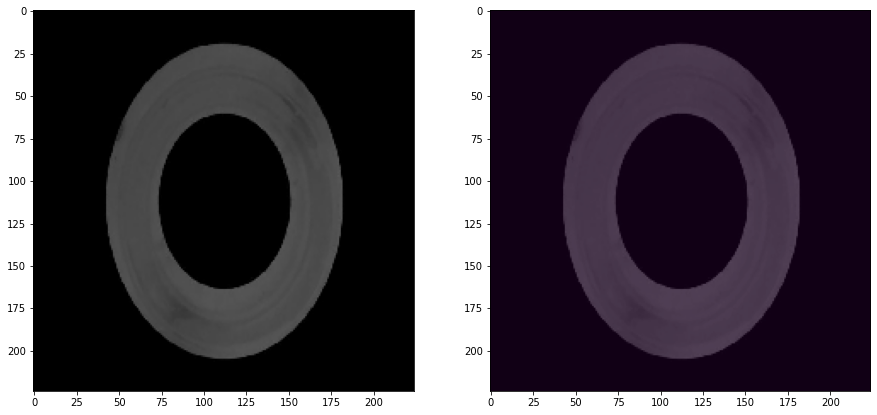

Threshold: 124204.609375 MaxValue: 56931.8671875
GT: bien, anomaly detected: False


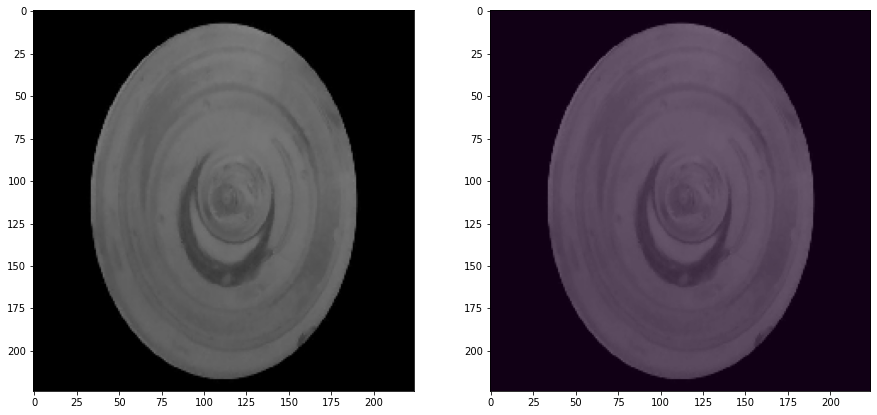

Threshold: 124204.609375 MaxValue: 70698.8671875
GT: bien, anomaly detected: False


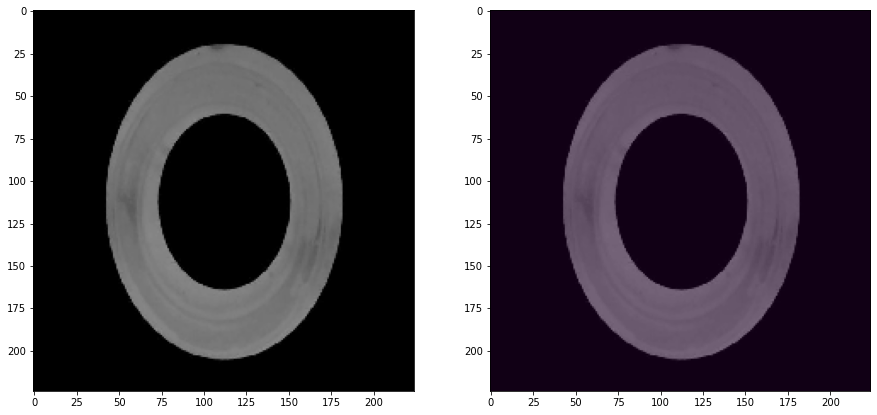

Threshold: 124204.609375 MaxValue: 76446.0390625
GT: bien, anomaly detected: False


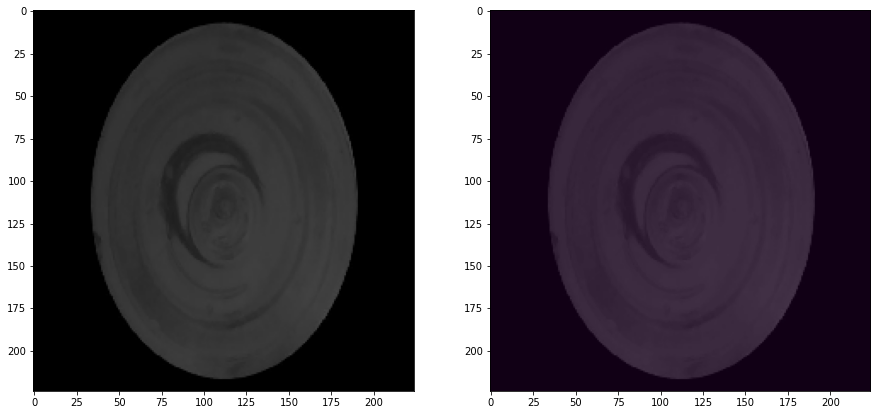

Threshold: 124204.609375 MaxValue: 56976.48046875
GT: mal, anomaly detected: False


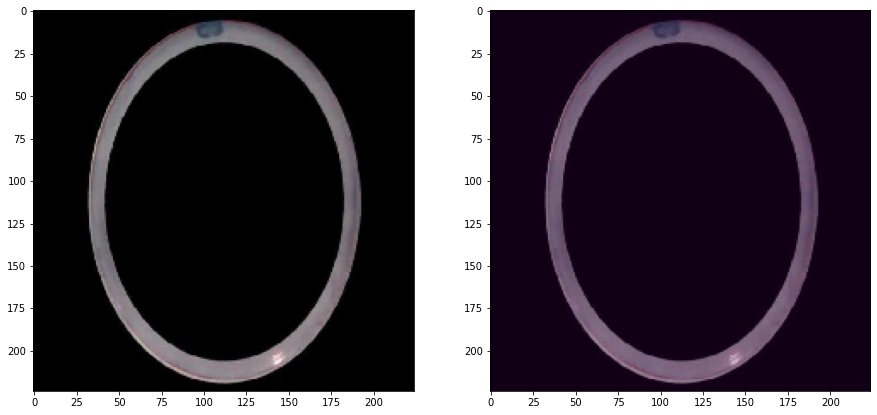

Threshold: 124204.609375 MaxValue: 123077.09375
GT: mal, anomaly detected: True


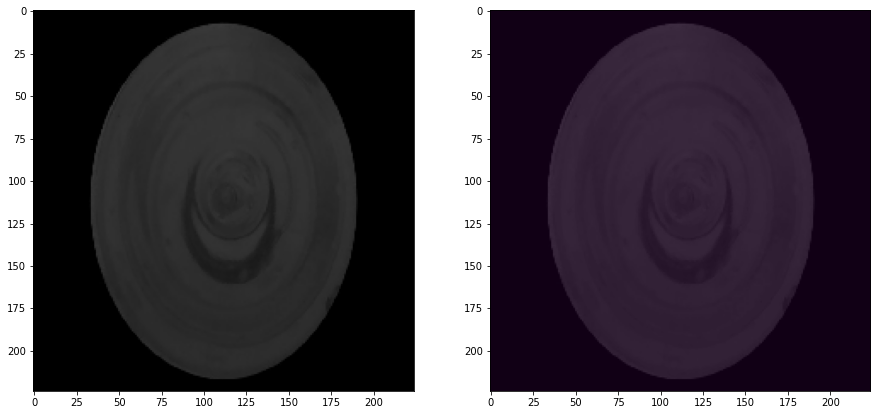

Threshold: 124204.609375 MaxValue: 56954.60546875
GT: bien, anomaly detected: False


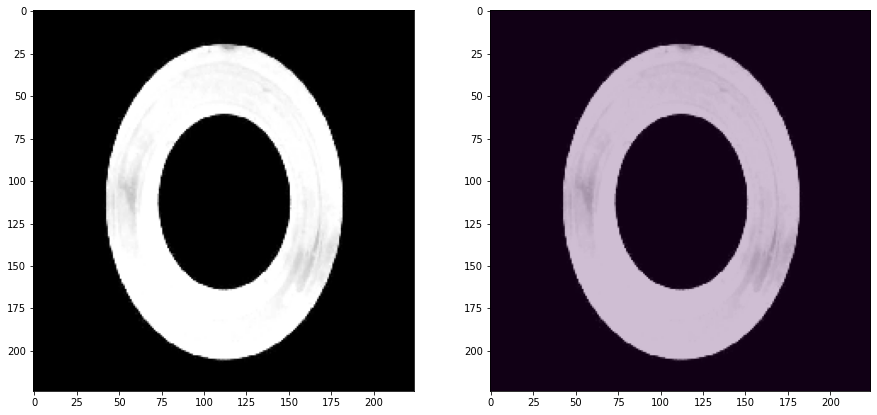

Threshold: 124204.609375 MaxValue: 122516.8125
GT: bien, anomaly detected: False


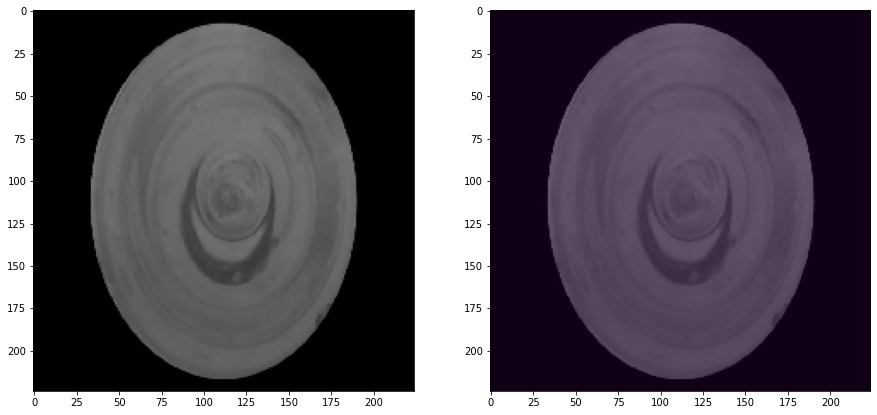

Threshold: 124204.609375 MaxValue: 69360.0390625
GT: bien, anomaly detected: False


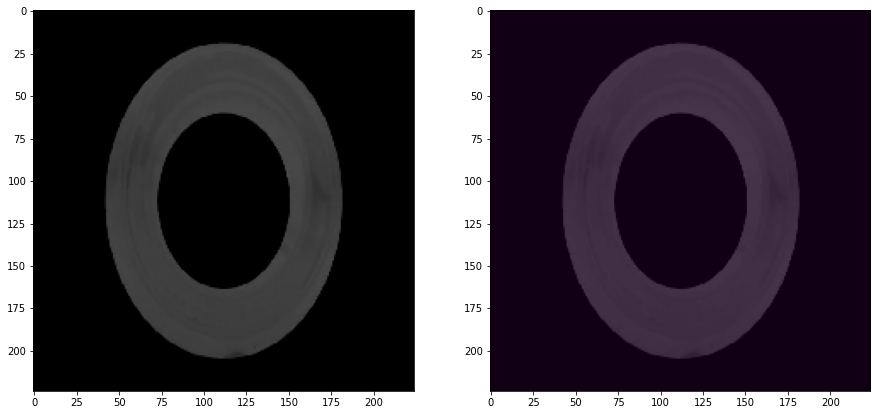

Threshold: 124204.609375 MaxValue: 56929.30859375
GT: mal, anomaly detected: False


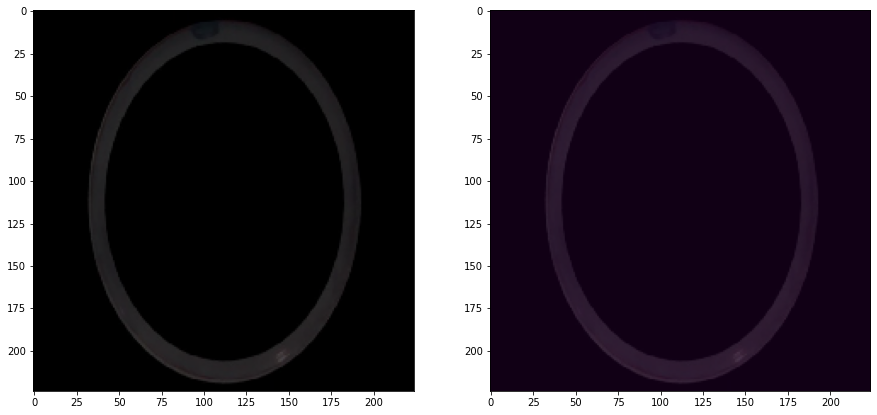

Threshold: 124204.609375 MaxValue: 56979.1484375
GT: mal, anomaly detected: False


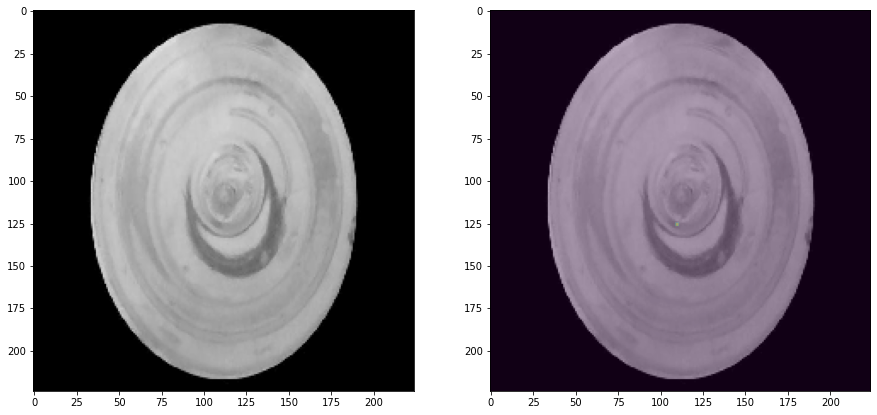

Threshold: 124204.609375 MaxValue: 124946.2890625
GT: mal, anomaly detected: True


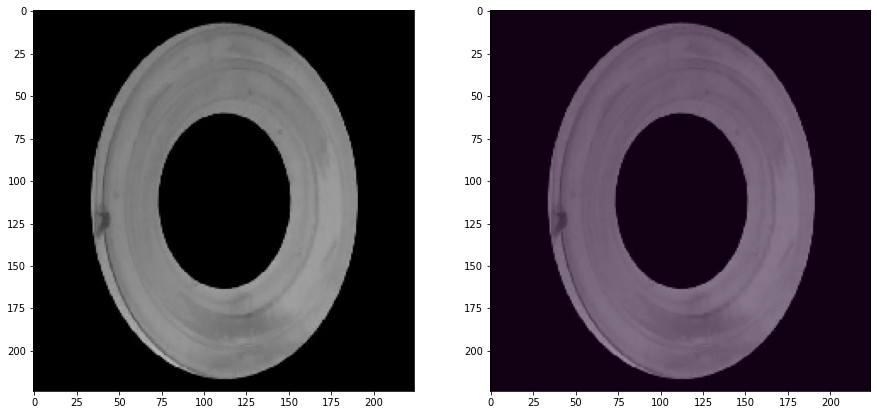

Threshold: 124204.609375 MaxValue: 85564.4453125
GT: mal, anomaly detected: False


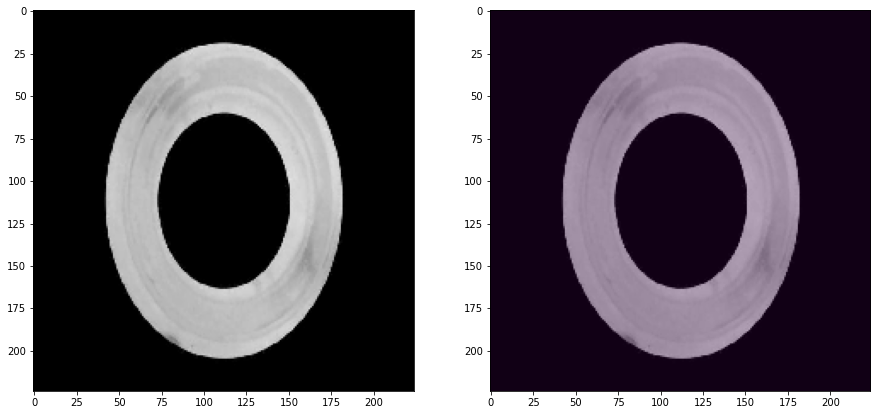

Threshold: 124204.609375 MaxValue: 103300.640625
GT: mal, anomaly detected: False


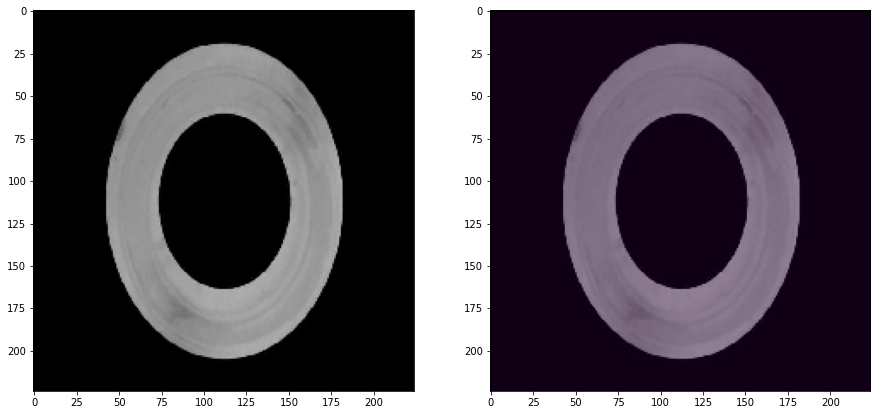

Threshold: 124204.609375 MaxValue: 89258.90625
GT: mal, anomaly detected: False


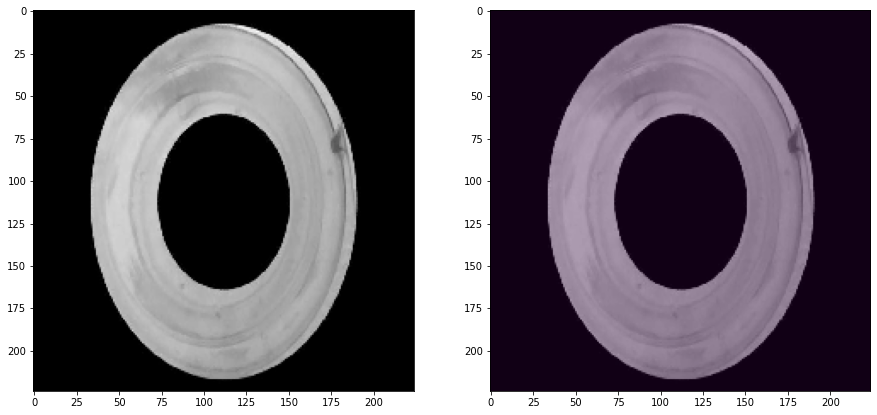

Threshold: 124204.609375 MaxValue: 99963.1015625
GT: bien, anomaly detected: False


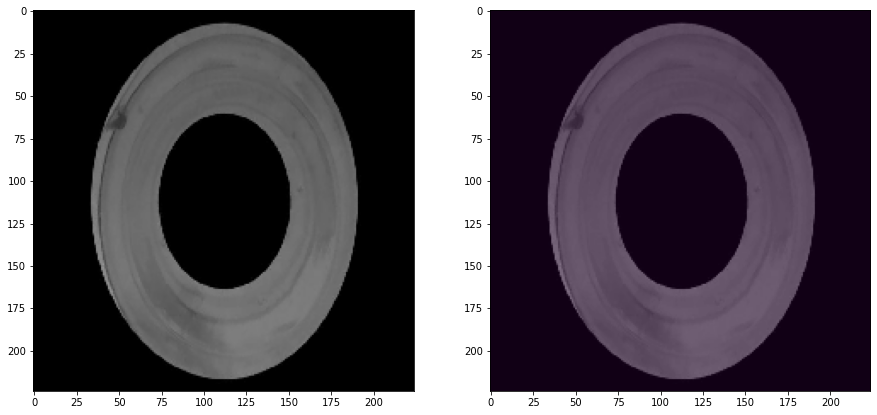

Threshold: 124204.609375 MaxValue: 78608.90625
GT: mal, anomaly detected: False


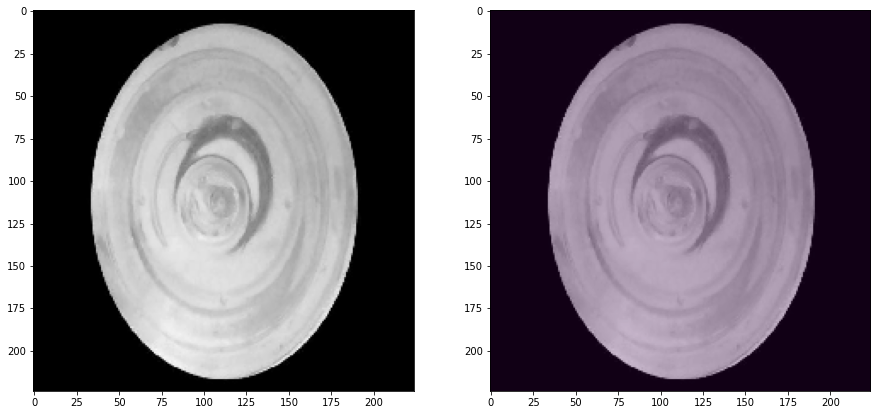

Threshold: 124204.609375 MaxValue: 118310.34375
GT: mal, anomaly detected: False


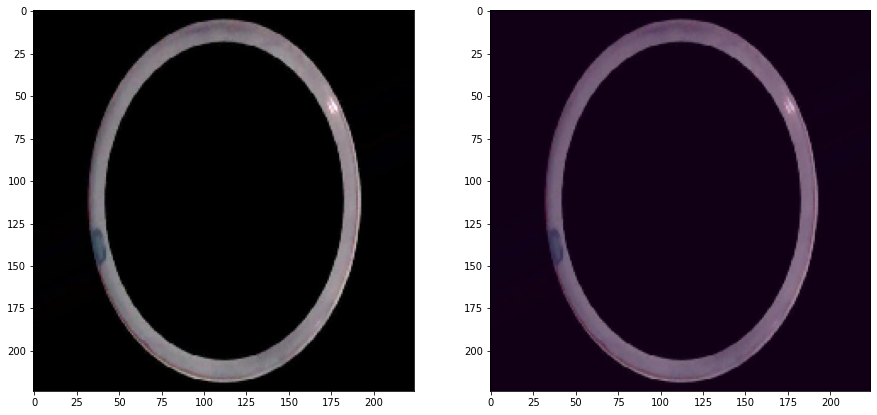

Threshold: 124204.609375 MaxValue: 99332.5859375
GT: bien, anomaly detected: False


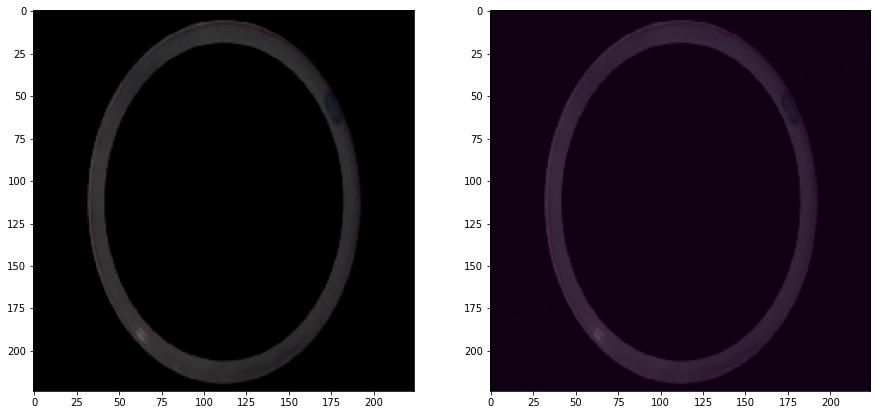

Threshold: 124204.609375 MaxValue: 67362.921875
GT: mal, anomaly detected: False


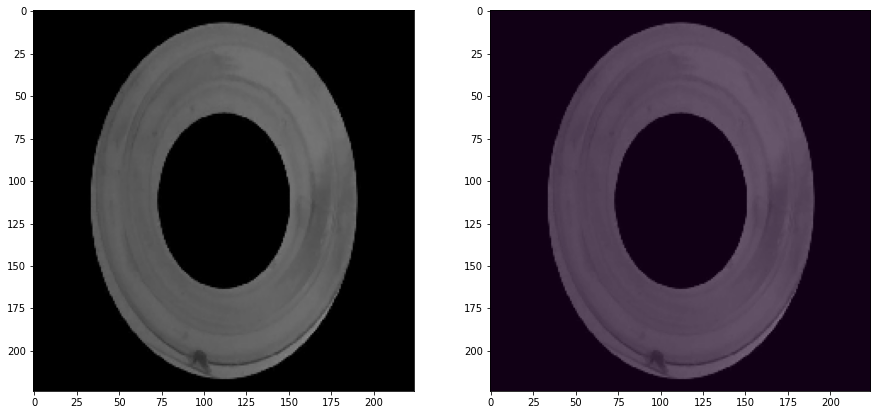

Threshold: 124204.609375 MaxValue: 72481.9375
GT: mal, anomaly detected: False


In [27]:
for i in range(10):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

        prediction = np.any(hotmap > as_model.threshold)

        hotmap = resize(hotmap, x.shape[:-1], anti_aliasing = True)
        mask = np.where(hotmap > as_model.threshold, 1, 0)
        

        f, axarr = plt.subplots(1,2, figsize=(15,15))
        axarr[0].imshow(x)
        axarr[1].imshow(mask)
        axarr[1].imshow(x, alpha = 0.75)
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
       
    